In [1]:
import numpy as np
import matplotlib.pyplot as plt
from MDAnalysis import *
import matplotlib as mpl
from matplotlib import cm
from scipy import optimize
mpl.rcParams['axes.linewidth'] = 1.4
Z=20
import pandas as pd
from scipy.stats import spearmanr, kendalltau, pearsonr
import math
from matplotlib.ticker import FormatStrFormatter

In [2]:
#EXP=Affinity constant, std, ranking
EXP = {"N1A16": [0, 0, 28],
      "N1A17" : [0, 0, 27],
      "N3A10" : [0, 0, 26],
      "N3A11" : [0, 0, 25],
      "N3A18" : [0, 0, 24],
      "N5A6"  : [0, 0, 23],
      "N5A16" : [0, 0, 22],
      "N5A17" : [0, 0, 21],
      "N5A13" :[93, 22, 20],
      "N6A20" :[120, 5, 19],
      "N2A13" :[1000, 230, 18],
      "N7A20" :[1100, 0, 17],
      "N2A11" :[8.5*10**4, 1.5*10**4, 16],
      "N2A10" :[9.3*10**4, 1.2*10**4, 15],
      "N1A9"  :[1.2*10**5, 0.2*10**5, 14],
      "N1A8"  :[1.3*10**5, 0.2*10**5, 13],
      "N1A7"  :[2.6*10**5, 0.6*10**5, 12],
      "N1A13" :[2.7*10**5, 0.3*10**5, 11],
      "N1A1"  :[3.6*10**5, 0, 10],
      "N3A19" :[3.6*10**5, 0.1*10**5, 9],
      "N1A15" :[3.7*10**5, 0, 8],
      "N1A12" :[3.9*10**5, 0.3*10**5, 7],
      "N1A10" :[4.1*10**5, 0.4*10**5, 6],
      "N1A14" :[4.6*10**5, 0, 5],
      "N1A11" :[4.8*10**5, 0.5*10**5, 4],
      "N2A18" :[5.1*10**5, 0.3*10**5, 3],   
      "N1A18" :[6.1*10**5, 1.4*10**5, 2],
      "N2A19" :[1.3*10**6, 0.1*10**6, 1],
      "N1A19" :[2.2*10**6, 0.1*10**6, 0],
      }

NP_lonepairs = {1:7, 2:9, 3:9, 5:14, 6:8, 7:8}
NP_hydrogens = {1:0, 2:1, 3:1, 5:1, 6:1, 7:2}
AN_lonepairs = {1:0, 6:0, 7:0, 8:2, 9:4, 10:2, 11:2, 12:4, 13:2, 14:5, 15:2, 16:5, 17:7, 18:0, 19:0, 20:7}
AN_hydrogens = {1:3, 6:2, 7:4, 8:4, 9:5, 10:3, 11:3, 12:3, 13:5, 14:3, 15:3, 16:3, 17:1, 18:3, 19:3, 20:1} #Fluors were included

Ns = [int(key.split('A')[0].split("N")[1]) for key in EXP.keys()]
As = [int(key.split('A')[1]) for key in EXP.keys()]
Systems = ["N{}A{}".format(n,a) for n,a in zip(Ns, As)]
act_mean = [EXP["N{}A{}".format(n, a)][0] for n, a in zip(Ns, As)]
act_std = [EXP["N{}A{}".format(n, a)][1] for n, a in zip(Ns, As)]
act_rank = [EXP["N{}A{}".format(n, a)][2] for n, a in zip(Ns, As)]
nano_lonepairs = [NP_lonepairs[n] for n in Ns]
nano_hydrogens = [NP_hydrogens[n] for n in Ns]
ana_lonepairs = [AN_lonepairs[a] for a in As]
ana_hydrogens = [AN_hydrogens[a] for a in As]
colors = np.round(cm.rainbow(np.linspace(0, 1, len(Ns))), 2)
colnames = ['Nanoparticle', 'Analyte', 'Act_Mean', 'Act_Std', 'Act_Rank', 'NP_Acceptors', 'NP_Donors', 'AN_Acceptors', 'AN_Donors', 'Color']
DATA = pd.DataFrame(zip(Ns, As, act_mean, act_std, act_rank, nano_lonepairs, nano_hydrogens, ana_lonepairs, ana_hydrogens, colors), columns=colnames, index=Systems)
DATA.index.name = "System"

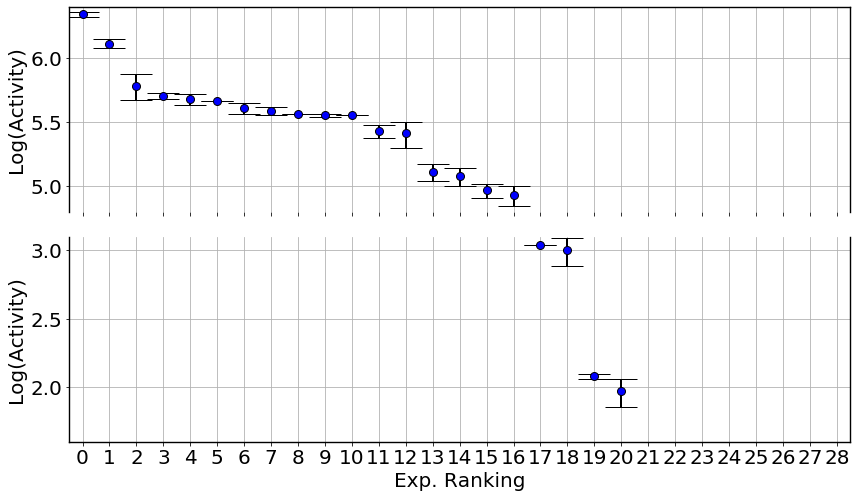

In [3]:
act_means = DATA.Act_Mean.values*1
act_means[act_means==0] = 1.0
act_stds = DATA.Act_Std.values*1
log_means = np.log10(act_means)
DATA['Act_log'] = log_means
err_up = np.log10(act_means+act_stds) - np.log10(act_means)
err_down = np.log10(act_means) - np.log10(act_means-act_stds)
error = np.array([err_down, err_up])
DATA['Act_log_error_up'] = err_up
DATA['Act_log_error_down'] = err_down

subplot_kw={'xlim':(-0.5, max(DATA.Act_Rank)+0.5), 'xticks':np.linspace(0,max(DATA.Act_Rank), max(DATA.Act_Rank)+1)}
fig, axs = plt.subplots(figsize=(14,8), sharex=True, ncols=1, nrows=2, subplot_kw=subplot_kw, gridspec_kw={'hspace':0.12, 'wspace':0.0})
plt.xlabel("Log(Binding constant)", fontsize=Z)
for ax in axs:
    ax.grid()
    ax.set_ylabel("Log(Activity)", fontsize=Z)
    ax.tick_params(labelsize=Z)
    ax.errorbar(DATA.Act_Rank, DATA.Act_log, yerr=error, fmt='o', capsize=16, markeredgecolor='k', markeredgewidth=1, markerfacecolor='b', markersize=8, linewidth=2, color='k')
axs[0].set_ylim(4.8,6.4)
axs[0].spines['bottom'].set_visible(False)
axs[1].set_ylim(1.6,3.1)
axs[1].spines['top'].set_visible(False)
axs[-1].set_xlabel("Exp. Ranking", fontsize=Z)
plt.show()
plt.close()

In [4]:
Act_Rank_Std_up = []
Act_Rank_Std_down = []
N = len(DATA)
n_act = np.sum(DATA.Act_Mean > 0.0)
for i in range(N):
    lower_than = np.sum((DATA.Act_Mean[i] + DATA.Act_Std[i]) >= (DATA.Act_Mean[i:]-DATA.Act_Std[i:]))-1 #-1 to not count itself
    Act_Rank_Std_up.append(lower_than)
    greater_than = np.sum((DATA.Act_Mean[i] - DATA.Act_Std[i]) <= (DATA.Act_Mean[:i]+DATA.Act_Std[:i])) #-1 is absent because of slicing open/closed limits
    Act_Rank_Std_down.append(greater_than)
Act_Rank_Std_up = np.array(Act_Rank_Std_up)
DATA['Act_Rank_Std_up'] = Act_Rank_Std_up*1
DATA['Act_Rank_Std_down'] = Act_Rank_Std_down*1
DATA['Act_Rank_Std_up'].loc[DATA.Act_Mean==0.0] = DATA['Act_Rank_Std_down'].loc[DATA.Act_Mean==0.0]*1
DATA['Act_Rank_Std_down'].loc[DATA.Act_Mean==0.0] = Act_Rank_Std_up[DATA.Act_Mean==0.0]*1

DATA = DATA[['Nanoparticle', 'Analyte', 'Act_Mean', 'Act_Std', 'Act_Rank', 'Act_Rank_Std_up', 'Act_Rank_Std_down', 'Act_log', 'Act_log_error_up', 'Act_log_error_down', 'Color']]
#print(DATA.head())
#print(DATA.tail())
print(DATA[['Act_Mean', 'Act_Rank', 'Act_Rank_Std_up', 'Act_Rank_Std_down', 'Act_log', 'Act_log_error_up', 'Act_log_error_down']])

         Act_Mean  Act_Rank  Act_Rank_Std_up  Act_Rank_Std_down   Act_log  \
System                                                                      
N1A16         0.0        28                0                  7  0.000000   
N1A17         0.0        27                1                  6  0.000000   
N3A10         0.0        26                2                  5  0.000000   
N3A11         0.0        25                3                  4  0.000000   
N3A18         0.0        24                4                  3  0.000000   
N5A6          0.0        23                5                  2  0.000000   
N5A16         0.0        22                6                  1  0.000000   
N5A17         0.0        21                7                  0  0.000000   
N5A13        93.0        20                1                  0  1.968483   
N6A20       120.0        19                0                  1  2.079181   
N2A13      1000.0        18                1                  0  3.000000   

C:\Users\fsebastian\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\indexing.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [31]:
def read_text_file(fname):
    f = open(fname, "r")
    fl = f.readlines()
    f.close()
    
    data = []
    for line in fl:
        if "#" not in line and "@" not in line:
            data.append(line.split())
    clean = np.array(data, dtype='float')
    return clean

def ma(data, n_window):
    cumsum, moving_aves = [0], []

    for i, x in enumerate(data, 1):
        cumsum.append(cumsum[i-1] + x)
        if i>n_window:
            moving_ave = (cumsum[i] - cumsum[i-n_window])/n_window
            moving_aves.append(moving_ave)
    moving_aves = np.array(moving_aves)
    return moving_aves

def consensed_rank(predicted_ranks):
    predicted_ranks = np.array(predicted_ranks)
    mean_ranks = []
    for i in range(N-1,-1,-1):
        ndxs = np.where(predicted_ranks == i)
        mean_rank = np.mean(ndxs[1])
        mean_ranks.append(mean_rank)
    mean_ranks = np.array(mean_ranks)
    return mean_ranks
    
def alfacalc(x, important_perc):
    return np.exp(-x*important_perc/100)-0.8*np.exp(-x)-0.2

def alfacalc_temp(x, T_max, important_T):
    return np.exp(-x*important_T) - 0.8*np.exp(-x*T_max) - 0.2

def RIE(alfa, n, N, metric):
    const = n/N*((1-np.exp(-alfa))/(np.exp(alfa/N)-1))
    met_argsort = np.argsort(-1*metric)
    active_slots = np.where(met_argsort < n)[0]
    xi = (active_slots+1)/N
    imp = np.sum(np.exp(-alfa*xi))
    rie = imp/const
    return rie

def BEDROC(metric, important_perc=30):
    #Metric must follow the premise: The lowest the more active!!!!
    N = len(DATA)
    n = (DATA.Act_Mean > 0).sum()

    #important_perc = n/N*100
    alfa = optimize.brentq(alfacalc, 0.0001, 1000000, args=(important_perc))
    rie = RIE(alfa, n, N, metric)
    
    ra = n/N
    rie_min = (1-np.exp(alfa*ra))/(ra*(1-np.exp(alfa)))
    rie_max = (1-np.exp(-alfa*ra))/(ra*(1-np.exp(-alfa)))
    bedroc = (rie-rie_min)/(rie_max-rie_min)
    return bedroc

def confusion_matrix(metric):
    N = len(DATA)
    n = (DATA.Act_Mean > 0).sum()
    met_argsort = np.argsort(metric)
    tp = np.sum(met_argsort[:n] >= N-n)
    fp = np.sum(met_argsort[:n] < N-n)
    fn = np.sum(met_argsort[n:] >= N-n)
    tn = np.sum(met_argsort[n:] < N-n)
    matrix_abs = np.array([[tp, fp], [fn, tn]])
    
    tpr = tp/(tp + fn)
    fpr = fp/(fp + tn)
    fnr = fn/(fn + tp)
    tnr = tn/(tn + fp)
    matrix_rel = np.array([[tpr, fpr], [fnr, tnr]])
    return matrix_abs, matrix_rel

conf_colors = [(0,0,0.6), (0.8,0,0), (1,0.4,0.6), (0,0.6,1)]
conf_abs_labels = ["TP", "FP", "FN", "TN"]
conf_rel_labels = ["TPR", "FPR", "FNR", "TNR"]

chis = np.linspace(0.5, 60, 12)
c_chis = cm.magma(np.linspace(0.25,1,len(chis)))

In [6]:
def plot_ranking(metric, args, yaxis="rank", reverse_metric=False,
                xlabel="Predicted", ylabel=None, title=None,
                grid=False, xlim=(-0.5,N-0.5), ylim=None,
                xticks=np.arange(0,N, 2, dtype='int'), xtl=np.arange(0,N, 2, dtype='int'),
                yticks=None, ytl=None, 
                fmt='o', capsize=8, mec='k', mew=1, lw=1, lc='k', ms=8,
                tight=False, leg=True, loc='best',
                pane_color='k', pane_alpha=0.3,
                line_color='k', line_width=0.5, line_alpha=0.8,
                a=None):
    
    met = metric(*args)
    if reverse_metric:
        met = -1*met
    xdata = np.argsort(met)
    if yaxis == 'rank':
        ydata = DATA.Act_Rank*1
        yerr = DATA[['Act_Rank_Std_down', 'Act_Rank_Std_up']].values*1
        if ylabel == None:
            ylabel = "Experimental"
        if ylim == None:
            ylim = (-0.5, N-0.5)
        if yticks == None:
            yticks = np.arange(0,N, 2, dtype='int')
        if ytl == None:
            ytl = np.arange(0,N, 2, dtype='int')
    elif yaxis == 'act_rank':
        ydata = DATA.Act_Rank*1
        yerr = DATA[['Act_Rank_Std_down', 'Act_Rank_Std_up']].values*1
        if ylabel == None:
            ylabel = "Experimental"
        if ylim == None:
            ylim = (-0.5, N-0.5)
        if yticks == None:
            yticks = np.arange(0,N, 2, dtype='int')
        if ytl == None:
            ytl = np.array2string(DATA.Act_Mean[::2].values, separator=" ")[1:-1].split()
            ytl.reverse()
    elif yaxis == 'act':
        ydata = DATA.Act_Mean*1
        yerr = DATA.Act_Std*1
        if ylabel == None:
            ylabel = "Binding constant"
        if ylim == None:
            ylim = (DATA.Act_Mean.min(), DATA.Act_Mean.max()+DATA.Act_Std.max())
        if yticks == None:
            yticks = np.linspace(DATA.Act_Mean.min(), DATA.Act_Mean.max()+DATA.Act_Std.max(), N//2)
        if ytl == None:
            ytl = yticks*1
    elif yaxis == 'logact':
        ydata = DATA.Act_log*1
        yerr = DATA[['Act_log_error_down', 'Act_log_error_up']].values*1
        ymin = DATA.Act_log.min()-1
        ymax = math.floor(DATA.Act_log.max()+DATA.Act_log_error_up.max())
        if ylabel == None:
            ylabel = "Log(Binding constant)"
        if ylim == None:
            ylim = (ymin,ymax)
        if yticks == None:
            yticks = np.linspace(ymin, ymax, ymax-ymin+1, dtype='int')
        if ytl == None:
            ytl = yticks*1
    rho, p_rho = spearmanr(DATA.Act_Rank, xdata)
    
    if a == None:
        a = plt.axes()
    a.set_xlim(xlim)
    a.set_ylim(ylim)
    a.set_xticks(xticks)
    a.set_yticks(yticks)
    a.set_xticklabels(xtl)
    a.set_yticklabels(ytl)
    a.tick_params(labelsize=Z)
    a.set_title(title, fontsize=Z)
    a.set_xlabel(xlabel, fontsize=Z)
    a.set_ylabel(ylabel, fontsize=Z)
    a.plot([], [], lw=3, c='k', label=r"$\rho$={:.2f}".format(rho))
    for pred_av, exp, exp_std, c in zip(xdata, ydata, yerr, DATA['Color']):
        #a.errorbar([pred_av], [exp], yerr=np.array([exp_std]).T, xerr=[pred_std], fmt=fmt, capsize=capsize, markeredgecolor=mec, markeredgewidth=mew, markerfacecolor=c, markersize=ms, linewidth=lw, color=lc
        a.errorbar([pred_av], [exp], yerr=np.array([exp_std]).T, fmt=fmt, capsize=capsize, markeredgecolor=mec, markeredgewidth=mew, markerfacecolor=c, markersize=ms, linewidth=lw, color=lc)

    a.axvline(n_act, c=line_color, lw=line_width, alpha=line_alpha)
    if yaxis == 'rank':
        a.fill_between([n_act, N], [N,N], [n_act, n_act], color=pane_color, alpha=pane_alpha)
        a.axhline(n_act, c=line_color, lw=line_width, alpha=line_alpha)
    if yaxis == 'act':
        a.yaxis.set_major_formatter(FormatStrFormatter('%.2E'))
        
    if grid:
        a.grid()
    if leg:
        a.legend(fontsize=Z, loc=loc)
    return a

In [110]:
def plot_metric(metric, xdata, args, reverse_metric=False,
                a1=None, a2=None, a3=None, a4=None,
                
                xlim1=None, xticks1=None, xlabel1="Free parameter", xtl1=None,
                ylim1=None, yticks1=None, ylabel1="Sorting\nmetric", ytl1=None,
                title1="", grid1=False, chi_show=30, a1fmty="%.1f", a1fmtx="%.1f",
                
                xlim2=None, xticks2=None, xlabel2="Free parameter", xtl2=None,
                ylim2=(-0.05,1.05), yticks2=np.arange(0.2,1.1,0.2), ylabel2="BEDROC", ytl2=np.arange(0.2,1.1,0.2),
                title2="", grid2=False, leg2=True, loc2='best', a2fmty="%.1f", a2fmtx="%.1f",
                
                xlim3=None, xticks3=None, xlabel3="Free parameter", xtl3=None,
                ylim3=(-0.05,1.05), yticks3=np.arange(0.2,1.1,0.2), ylabel3="Corr.\ncoefficient", ytl3=np.arange(0.2,1.1,0.2),
                title3="", grid3=False, leg3=True, loc3='best', a3fmty="%.1f", a3fmtx="%.1f",
                
                xlim4=None, xticks4=None, xlabel4="Free parameter", xtl4=None,
                ylim4=(-0.05, 1.05), yticks4=np.arange(0.2,1.1,0.2), ylabel4="Fraction", ytl4=np.arange(0.2,1.1,0.2),
                title4="", grid4=False, leg4=True, loc4='best', a4fmty="%.1f", a4fmtx="%.1f"):
    
    ###It requries for the metric function to take xdata as first parameter!
    ydata = []
    bedrocs = []
    rhos, p_rhos = [], []
    taus, p_taus = [], []
    pearsons, p_pearsons = [], []
    conf_mats_abs, conf_mats_rel = [], []
    for xpt in xdata:
        ypt = metric(xpt, *args)
        if reverse_metric:
            ypt = ypt*-1
        ydata.append(ypt)
        bedroc_tmp = []
        for chi in chis:
            bedroc = BEDROC(ypt, important_perc=chi)
            bedroc_tmp.append(bedroc)
        bedrocs.append(bedroc_tmp)
        rho, p_rho = spearmanr(DATA.Act_Rank, ypt)
        rhos.append(rho)
        p_rhos.append(p_rho)
        tau, p_tau = kendalltau(DATA.Act_Rank, ypt)
        taus.append(tau)
        p_taus.append(p_tau)
        pearson, p_pearson = pearsonr(DATA.Act_Rank, np.argsort(ypt))
        pearsons.append(pearson)
        p_pearsons.append(p_pearson)
        conf_mat = confusion_matrix(ypt)
        conf_mats_abs.append(conf_mat[0])
        conf_mats_rel.append(conf_mat[1])
    bedrocs = np.array(bedrocs).T
    ydata = np.array(ydata)
    rhos, p_rhos = np.array(rhos), np.array(p_rhos)
    taus, p_taus = np.array(taus), np.array(p_taus)
    pearsons, p_pearsons = np.array(pearsons), np.array(p_pearsons)
    ydata = ydata.T
    conf_mats_abs = np.array(conf_mats_abs).reshape((len(conf_mats_abs),4)).T
    conf_mats_rel = np.array(conf_mats_rel).reshape((len(conf_mats_rel),4)).T
  
    if np.any(xlim1 == None):
        xlim1 = (min(xdata), max(xdata))
    if np.any(xticks1 == None):
        xticks1 = [min(xdata), max(xdata)]
    if np.any(xtl1 == None):
        xtl1 = [min(xdata), max(xdata)]
    if np.any(ylim1 == None):
        ylim1 = (np.min(ydata), np.max(ydata))
    if np.any(yticks1 == None):
        yticks1 = [np.min(ydata), np.max(ydata)]
    if np.any(ytl1 == None):
        ytl1 = [np.min(ydata), np.max(ydata)]
    if a1 == None:
        a1 = plt.axes()
    a1.set_title(title1)
    a1.tick_params(labelsize=Z)
    a1.set_xlim(xlim1)
    a1.set_xticks(xticks1)
    a1.set_xticklabels(xtl1, fontsize=Z)
    a1.set_xlabel(xlabel1, fontsize=Z)
    a1.set_ylim(ylim1)
    a1.set_yticks(yticks1)
    a1.set_yticklabels(ytl1, fontsize=Z)
    a1.set_ylabel(ylabel1, fontsize=Z)
    a1.yaxis.set_major_formatter(FormatStrFormatter(a1fmty))
    if reverse_metric:
        ydata = ydata*-1
    for ypt, c in zip(ydata, colors):
        a1.plot(xdata, ypt, color=c, lw=1.5)
    a1sub = a1.twinx()
    a1sub.tick_params(labelsize=Z)
    a1sub.set_ylabel("BEDROC", fontsize=Z)
    a1sub.set_ylim(0,1)
    a1sub.set_yticks(ytl2) #The same as for a2
    a1sub.axhline(y=0.8, xmin=0, xmax=1, c='k', lw=2, ls=':')
    a1sub.plot(xdata, bedrocs[np.argmin(np.abs(chis-chi_show))], color='k', lw=2, zorder=1)
    if grid1:
        a1.grid()
               
    if np.any(xlim2 == None):
        xlim2 = (min(xdata), max(xdata))
    if np.any(xticks2 == None):
        xticks2 = [min(xdata), max(xdata)]
    if np.any(xtl2 == None):
        xtl2 = [min(xdata), max(xdata)]
    if a2 == None:
        a2 = plt.axes()
    a2.set_title(title2)
    a2.tick_params(labelsize=Z)
    a2.set_xlim(xlim2)
    a2.set_xticks(xticks2)
    a2.set_xticklabels(xtl2, fontsize=Z)
    a2.set_xlabel(xlabel2, fontsize=Z)
    a2.set_ylim(ylim2)
    a2.set_yticks(yticks2)
    a2.set_yticklabels(ytl2, fontsize=Z)
    a2.set_ylabel(ylabel2, fontsize=Z)
    a2.yaxis.set_major_formatter(FormatStrFormatter(a2fmty))
    a2.axhline(y=0.8, xmin=0, xmax=1, c='k', lw=2, ls=':')
    for bedroc, c, chi in zip(bedrocs, c_chis, chis):
        a2.plot(xdata, bedroc, c=c, lw=2, label=r"$\chi=${:.0f}".format(chi))
    if grid2:
        a2.grid()
    if leg2:
        a2.legend(ncol=6, fontsize=Z-6, loc=loc2)
                   
    if np.any(xlim3 == None):
        xlim3 = (min(xdata), max(xdata))
    if np.any(xticks3 == None):
        xticks3 = [min(xdata), max(xdata)]
    if np.any(xtl3 == None):
        xtl3 = [min(xdata), max(xdata)]
    if a3 == None:
        a3 = plt.axes()
    a3.set_title(title3)
    a3.tick_params(labelsize=Z)
    a3.set_xlim(xlim3)
    a3.set_xticks(xticks3)
    a3.set_xticklabels(xtl3, fontsize=Z)
    a3.set_xlabel(xlabel3, fontsize=Z)
    a3.set_ylim(ylim3)
    a3.set_yticks(yticks3)
    a3.set_yticklabels(ytl3, fontsize=Z)
    a3.set_ylabel(ylabel3, fontsize=Z)
    a3.yaxis.set_major_formatter(FormatStrFormatter(a3fmty))
    a3.plot(xdata, rhos, c='b', lw=2, label=r"Spearman $\rho$")
    a3.plot(xdata, taus, c='orange', lw=2, label=r"Kendall $\tau$")
    a3.plot(xdata, pearsons, c='magenta', lw=2, label=r"Pearson $r$", zorder=1)
    if grid3:
        a3.grid()
    if leg3:
        a3.legend(fontsize=Z-6, loc=loc3)
               
    if np.any(xlim4 == None):
        xlim4 = (min(xdata), max(xdata))
    if np.any(xticks4 == None):
        xticks4 = [min(xdata), max(xdata)]
    if np.any(xtl4 == None):
        xtl4 = [min(xdata), max(xdata)]
    if a4 == None:
        a4 = plt.axes()
    a4.set_title(title4)
    a4.tick_params(labelsize=Z)
    a4.set_xlim(xlim4)
    a4.set_xticks(xticks4)
    a4.set_xticklabels(xtl4, fontsize=Z)
    a4.set_xlabel(xlabel4, fontsize=Z)
    a4.set_ylim(ylim4)
    a4.set_yticks(yticks4)
    a4.set_yticklabels(ytl4, fontsize=Z)
    a4.set_ylabel(ylabel4, fontsize=Z)
    a4.yaxis.set_major_formatter(FormatStrFormatter(a4fmty))
    for metric_rel, rel_lab, c in zip(conf_mats_rel, conf_rel_labels, conf_colors):
        a4.plot(xdata, metric_rel, label=rel_lab, c=c, ls='-', lw=2)
    if grid4:
        a4.grid()
    if leg4:
        a4.legend(fontsize=Z-6, loc=loc4)
    
    best_ndx = np.where(rhos==np.nanmax(rhos))[0]
    best_param = xdata[best_ndx[0]]
    print(r"rho({:.1f}) = {:.2f}".format(best_param, np.nanmax(rhos)))
    return (a1, a2, a3, a4)

In [8]:
sel = {"gold": "name AU AUS AUL",
      "analytes" : "resname A* and not resname AU AUS AUL",
      "np" : "resname L*"}

In [9]:
S = 3
Us = [] 

for NA in DATA.index:
    XTC = "./Mixtures/S{}/{}S{}/{}S{}_NVT_FIX.xtc".format(S, NA, S, NA, S)
    TPR = "./Mixtures/S{}/{}S{}/{}S{}_NVT.tpr".format(S, NA, S, NA, S)
    U = Universe(TPR, XTC)
    print(NA, len(U.trajectory))
    Us.append(U)

N1A16 2501
N1A17 2501
N3A10 2501
N3A11 2501
N3A18 2501
N5A6 2501
N5A16 2501
N5A17 2501
N5A13 2501
N6A20 2501
N2A13 2501
N7A20 2501
N2A11 2501
N2A10 2501
N1A9 2501
N1A8 2501
N1A7 2501
N1A13 2501
N1A1 2501
N3A19 2501
N1A15 2501
N1A12 2501
N1A10 2501
N1A14 2501
N1A11 2501
N2A18 2501
N1A18 2501
N2A19 2501
N1A19 2501


In [10]:
distances = []
all_rogs = []

for u, U in enumerate(Us):
    print(u)
    g_ref = U.select_atoms(sel["gold"])
    g_targets = U.select_atoms(sel["analytes"])
    g_np = U.select_atoms(sel["np"])
    dists_traj = []
    times = []
    rogs = []
    for ts in U.trajectory:
        times.append(ts.time)
        rogs.append(g_np.radius_of_gyration())
        ref_com = g_ref.center_of_mass()
        dists_frame = []
        for res in g_targets.residues:
            dist = np.linalg.norm(res.atoms.center_of_mass() - ref_com)
            dists_frame.append(dist)
        dists_traj.append(dists_frame)
    distances.append(dists_traj)
    all_rogs.append(rogs)

all_rogs = np.array(all_rogs)
distances = np.array(distances)
times = np.array(times)/1000
print(np.shape(distances))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
(29, 2501, 10)


In [11]:
rog_tini, rog_tfin = 3, 5 #ns. Interval where to calculate the mean r.o.g
mean_rogs = [np.mean(rogs[np.logical_and(times>=rog_tini, times<=rog_tfin)]) for rogs in all_rogs]
mean_rogs = np.array(mean_rogs)

In [12]:
Ts = []
for NA in DATA.index:
    XVG = "./Mixtures/S{}/{}S{}/{}S{}_NVT.xvg".format(S, NA, S, NA, S)
    Ts.append(read_text_file(XVG))
Ts = np.array(Ts)

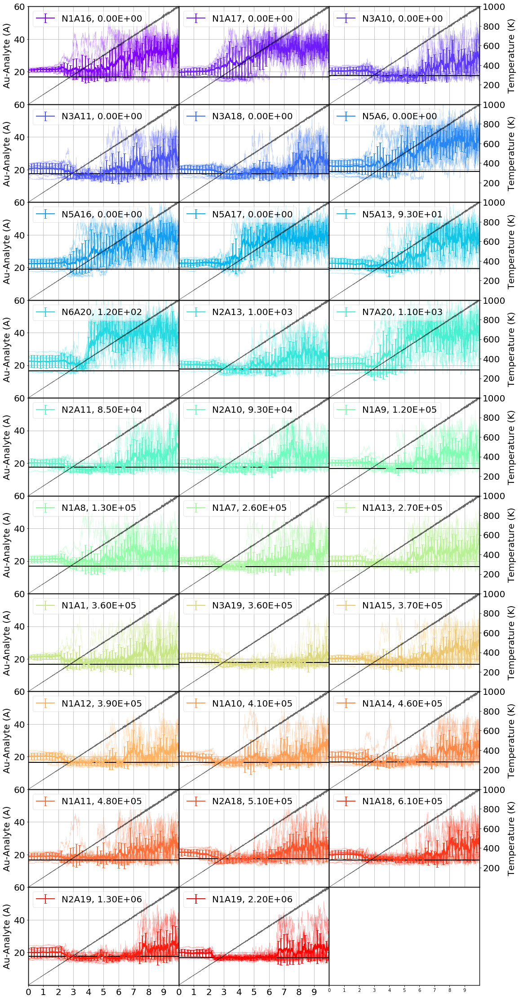

In [13]:
ncols=3
nrows=10
subplot_kw = {'xlim':(0,10), 'xticks':np.linspace(0,9,10), 'ylim':(0,60), 'yticks':[20,40,60]}
gridspec_kw = {'hspace':0.0, 'wspace':0.0}
fig, axs = plt.subplots(figsize=(18, 40), nrows=nrows, ncols=ncols, sharey=True, sharex=True, subplot_kw=subplot_kw, gridspec_kw=gridspec_kw)
for a, (ax, distance, c, key, mean, temp, rog) in enumerate(zip(axs.flatten(), distances, DATA.Color, DATA.index, DATA.Act_Mean, Ts, mean_rogs)):
    ax2 = ax.twinx()
    ax2.plot(temp[:,0]/1000, temp[:,1], lw=1, c='k', alpha=0.6)
    ax2.set_ylim(0,1000)
    ax2.set_xlim(0,10)
    if a%ncols==(ncols-1):
        ax2.tick_params(labelsize=Z)
        ax2.set_yticks([200,400,600,800,1000])
        ax2.set_ylabel("Temperature (K)", fontsize=Z)
    else:
        ax2.set_yticks([])
        
    ax.grid()
    ax.tick_params(labelsize=Z)
    for dist in distance.T:
        ax.plot(times, dist, alpha=0.3, lw=0.5, color=c)
    ax.errorbar(times, np.mean(distance, axis=1), yerr=np.std(distance, axis=1), lw=2, color=c, label="{}, {:.2E}".format(key, mean), errorevery=50, capsize=3)
    ax.axhline(rog, c='k', lw=2)
    ax.legend(fontsize=Z, loc='upper left', framealpha=0.5)
    
for ax in axs[:,0]:
    ax.set_ylabel("Au-Analyte (A)", fontsize=Z)
for ax in axs[0,:]:
    ax.set_xlabel("Time (ns)", fontsize=Z)
plt.show()
plt.close()

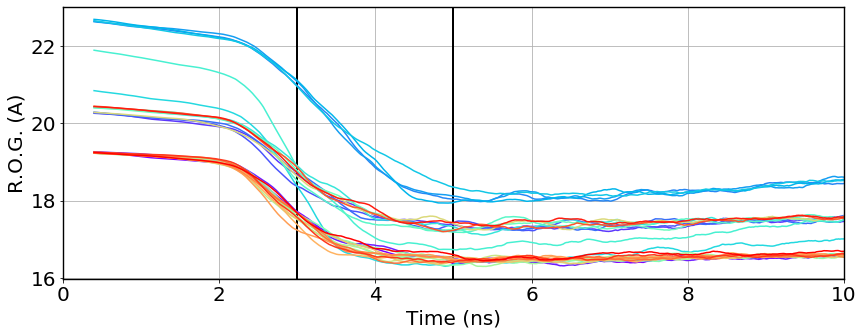

In [14]:
n_ma = 100
fig = plt.figure(figsize=(14,5))
ax = plt.axes()
ax.tick_params(labelsize=Z)
ax.set_xlabel("Time (ns)", fontsize=Z)
ax.set_ylabel("R.O.G. (A)", fontsize=Z)
ax.set_xlim(min(times), max(times))
ax.grid()
ax.axvline(rog_tini, lw=2, c='k')
ax.axvline(rog_tfin, lw=2, c='k')
for rogs, c in zip(all_rogs, DATA.Color) :
    ax.plot(times[n_ma:], ma(rogs, n_ma), c=c, lw=1.5)
plt.show()
plt.close()

# Distances distribution

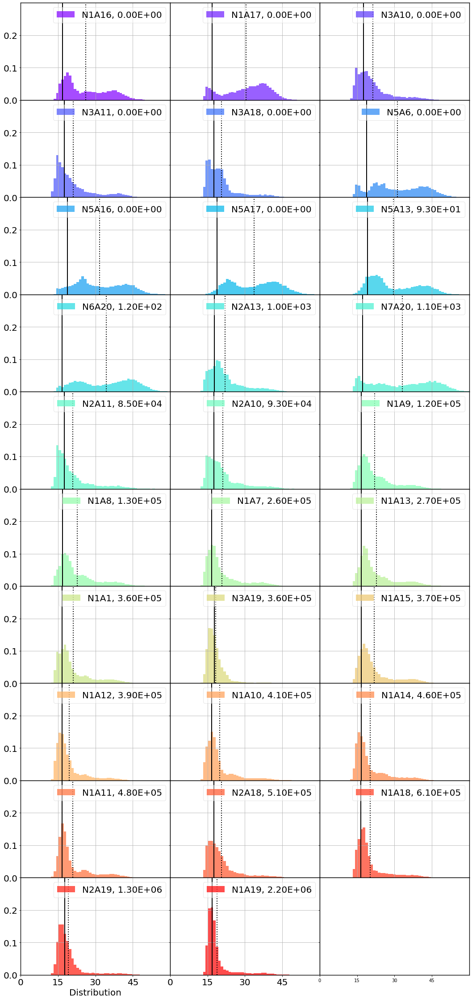

In [15]:
subplot_kw = {'xlim':(0,60), 'xticks':np.linspace(0,45,4), 'ylim':(0,0.3), 'yticks':np.linspace(0,0.2,3)}
gridspec_kw = {'hspace':0.0, 'wspace':0.0}
fig, axs = plt.subplots(figsize=(18, 40), nrows=10, ncols=3, sharey=True, sharex=True, subplot_kw=subplot_kw, gridspec_kw=gridspec_kw)
for ax, distance, c, key, mean, rog in zip(axs.flatten(), distances, DATA.Color, DATA.index, DATA.Act_Mean, mean_rogs):
    data = distance[times>=2]
    ax.grid()
    ax.tick_params(labelsize=Z)
    ax.hist(data.flatten(), color=c, density=True, bins=np.linspace(0,60,60), label="{}, {:.2E}".format(key, mean), alpha=0.7)
    ax.axvline(np.mean(data), c='k', lw=2, ls=":")
    ax.axvline(rog, c='k', lw=2)
    ax.legend(fontsize=Z, loc='upper right', framealpha=0.5)
    
for ax in axs[0,:]:
    ax.set_xlabel("Au-Analyte (A)", fontsize=Z)
for ax in axs[:,0]:
    ax.set_xlabel("Distribution", fontsize=Z)
plt.show()
plt.close()

# Distance from R.O.G

In [16]:
def deviation_from_rog(distances):
    dist_means = np.mean(distances, axis=1)
    dist_means = np.mean(dist_means, axis=1)
    diff = dist_means - mean_rogs
    return diff

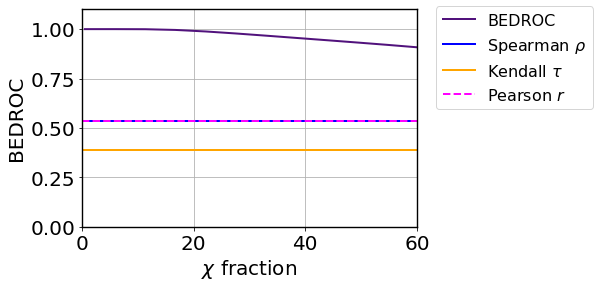

[[18  3]
 [ 3  5]]
[[0.85714286 0.375     ]
 [0.14285714 0.625     ]]


In [17]:
diff = deviation_from_rog(distances)
bedrocs = []
rho, p_rho = spearmanr(DATA.Act_Rank, diff)
tau, p_tau = kendalltau(DATA.Act_Rank, diff)
pearson, p_pearson = pearsonr(DATA.Act_Rank, np.argsort(diff))

for chi in chis:
    bedrocs.append(BEDROC(diff, important_perc=chi))


fig = plt.figure()
ax = plt.axes()
ax.plot(chis, bedrocs, lw=2, c=c_chis[0], label="BEDROC")
ax.axhline(y=rho, c='b', lw=2, label=r"Spearman $\rho$")
ax.axhline(y=tau, c='orange', lw=2, label=r"Kendall $\tau$")
ax.axhline(y=pearson, c='magenta', lw=2, label=r"Pearson $r$", ls='--')
ax.tick_params(labelsize=Z)
ax.set_xlabel(r"$\chi$ fraction", fontsize=Z)
ax.set_ylabel("BEDROC", fontsize=Z)
ax.set_ylim(0,1.1)
ax.set_xlim(0,60)
ax.grid()
ax.legend(fontsize=Z-4, bbox_to_anchor=(1.55,1.05))
plt.show()
plt.close()
conf_mat = confusion_matrix(diff)
print(conf_mat[0])
print(conf_mat[1])

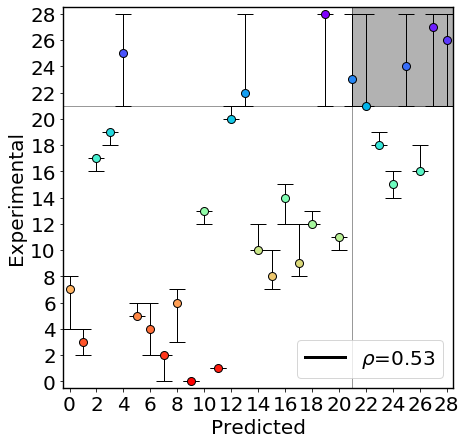

In [18]:
fig = plt.figure(figsize=(7,7))
ax = plot_ranking(deviation_from_rog, [distances], reverse_metric=False, yaxis="rank", loc='lower right')
plt.show()
plt.close()

# Weighted distance from R.O.G

In [19]:
def weighted_deviation_from_rog(important_T, dists, temps, mean_rogs, block_size=10, ascending=True):
    n_temps = len(temps[0,:,1])
    deviations = []
    T_max = np.max(temps[:,:,1])
    if not ascending:
        D_tildes = np.mean(np.sort(dists, axis=2)[:,:,block_size:], axis=2)
    else:
        D_tildes = np.mean(np.sort(dists, axis=2)[:,:,:block_size], axis=2)
    D_tildes = [D_tilde - mean_rog for D_tilde, mean_rog in zip(D_tildes, mean_rogs)]
    D_tildes = np.array(D_tildes)
    alpha = optimize.brentq(alfacalc_temp, 0.0001, 1000000, args=(T_max, important_T))
    A_norm = alpha/(1-np.exp(-alpha*T_max))
    for D_tilde, temp in zip(D_tildes, temps):
        D_weighted = A_norm*np.dot(D_tilde, np.exp(-alpha*temp[:,1]))
        deviations.append(D_weighted)
    deviations = np.array(deviations)
    return deviations

## Blocks from the analytes CLOSEST to com (yes, com) from 1 to 10

rho(800.0) = 0.31
rho(750.5) = 0.34
rho(750.5) = 0.40
rho(800.0) = 0.40
rho(729.3) = 0.43
rho(800.0) = 0.47
rho(764.6) = 0.48
rho(665.7) = 0.49
rho(800.0) = 0.52
rho(792.9) = 0.53


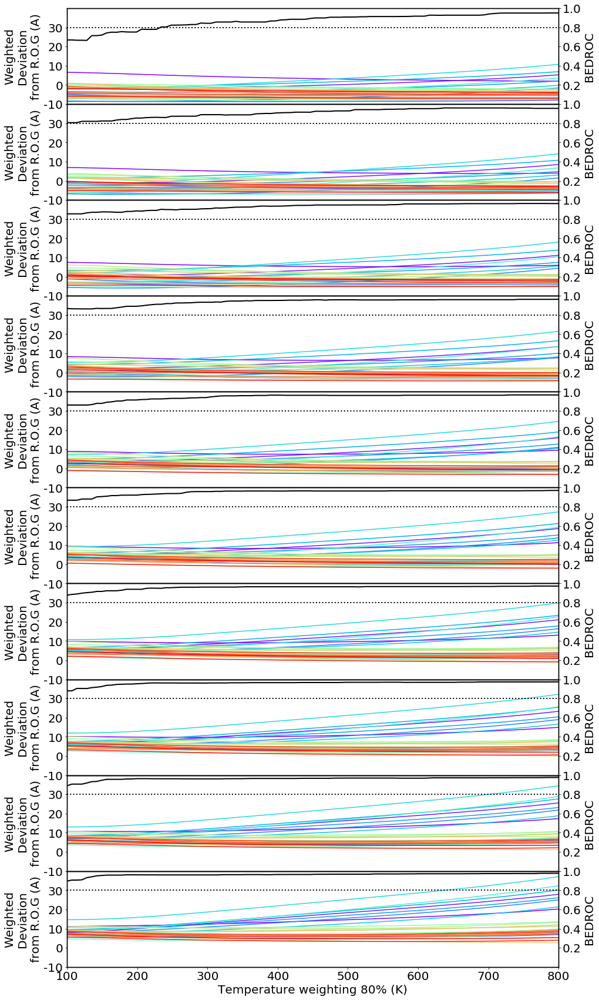

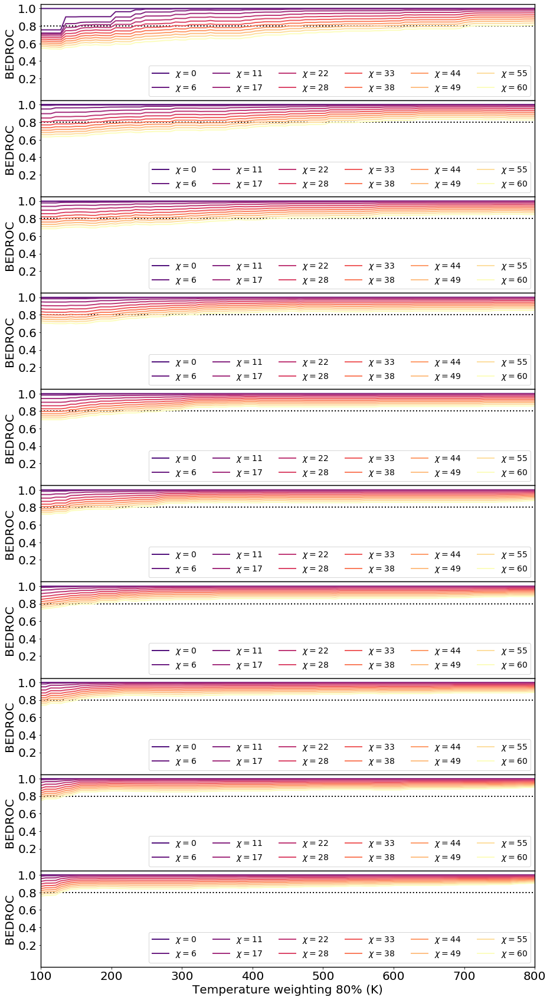

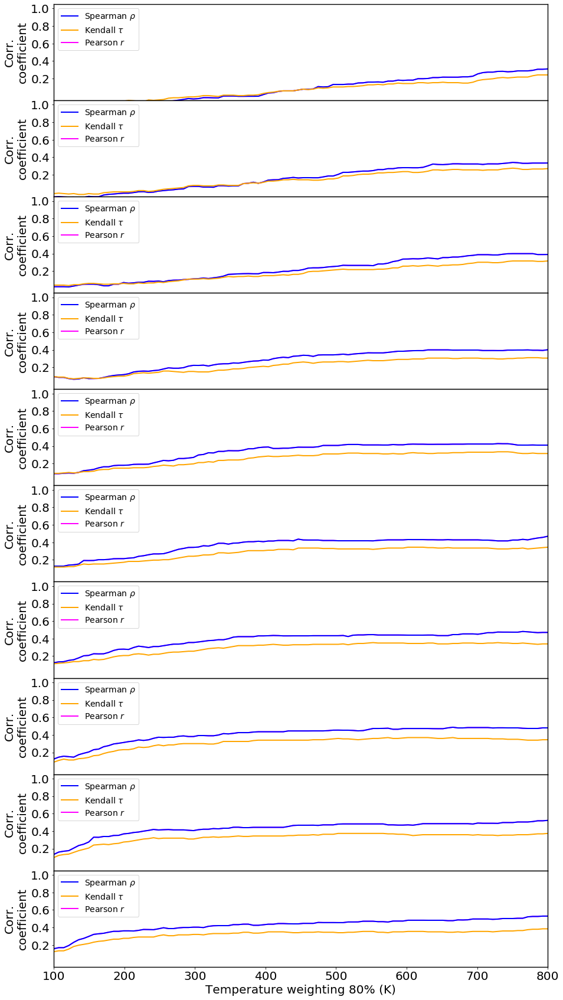

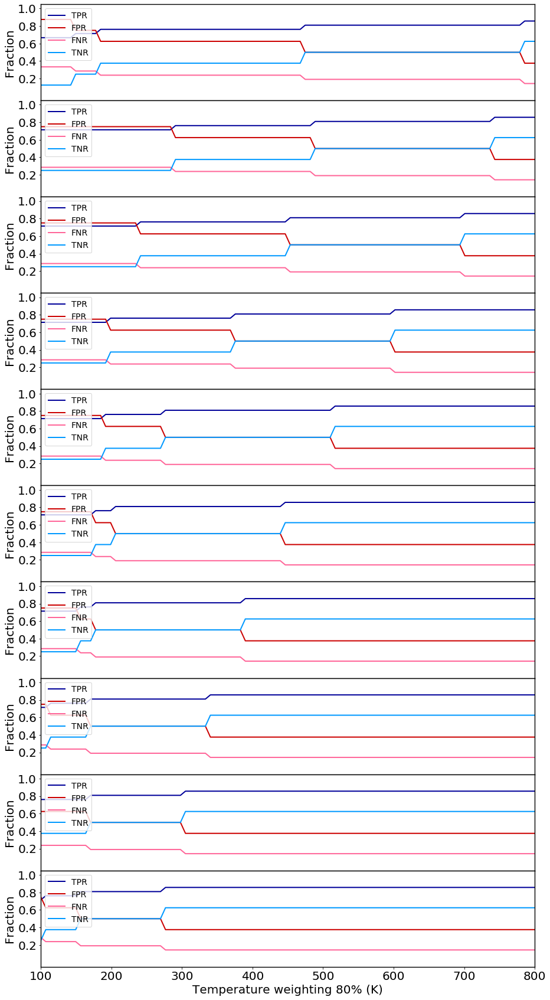

In [111]:
b_sizes = np.linspace(1,10,10, dtype='int')
important_temps = np.linspace(100, 800, 100)

xticks = np.linspace(min(important_temps), max(important_temps), 8, dtype='int')

fig1, axs1 = plt.subplots(figsize=(15,3*len(b_sizes)), sharex=True, ncols=1, nrows=len(b_sizes), gridspec_kw={'hspace':0.0, 'wspace':0.0})
fig2, axs2 = plt.subplots(figsize=(15,3*len(b_sizes)), sharex=True, ncols=1, nrows=len(b_sizes), gridspec_kw={'hspace':0.0, 'wspace':0.0})
fig3, axs3 = plt.subplots(figsize=(15,3*len(b_sizes)), sharex=True, ncols=1, nrows=len(b_sizes), gridspec_kw={'hspace':0.0, 'wspace':0.0})
fig4, axs4 = plt.subplots(figsize=(15,3*len(b_sizes)), sharex=True, ncols=1, nrows=len(b_sizes), gridspec_kw={'hspace':0.0, 'wspace':0.0})

for ax1, ax2, ax3, ax4, b in zip(axs1.flatten(), axs2.flatten(), axs3.flatten(), axs4.flatten(), b_sizes):
    plot_metric(weighted_deviation_from_rog, important_temps, [distances, Ts, mean_rogs, b, True], reverse_metric=False, 
                a1=ax1, a2=ax2, a3=ax3, a4=ax4,
               xticks1=xticks, xtl1=xticks, xlabel1="Temperature weighting 80% (K)", ylabel1="Weighted\nDeviation\nfrom R.O.G (A)", yticks1=np.arange(-10,40,10), ytl1=np.arange(-10,40,10), ylim1=(-10,40), a1fmty="%d", a1fmtx="%d",
               xticks2=xticks, xtl2=xticks, xlabel2="Temperature weighting 80% (K)", loc2="lower right", a2fmtx="%d",
               xticks3=xticks, xtl3=xticks, xlabel3="Temperature weighting 80% (K)", loc3="upper left", a3fmtx="%d",
               xticks4=xticks, xtl4=xticks, xlabel4="Temperature weighting 80% (K)", loc4="upper left", a4fmtx="%d")
plt.show()
plt.close()

### _Temperature weighting 80% = 800 K_

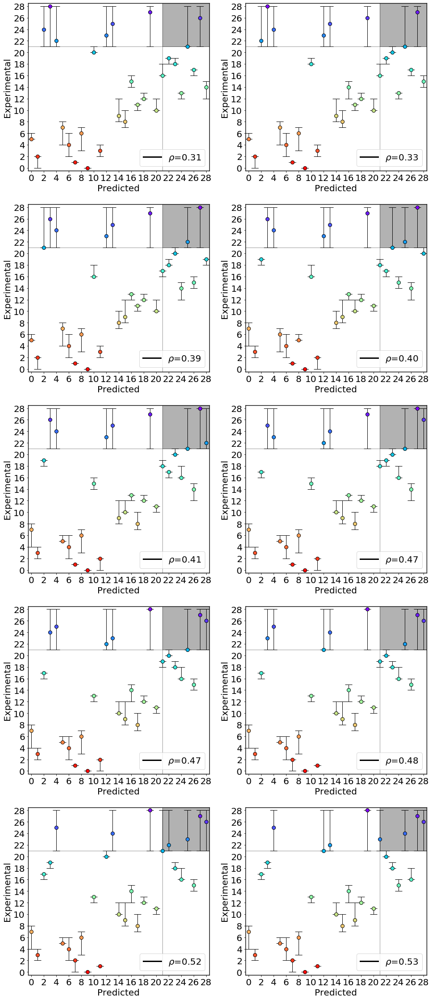

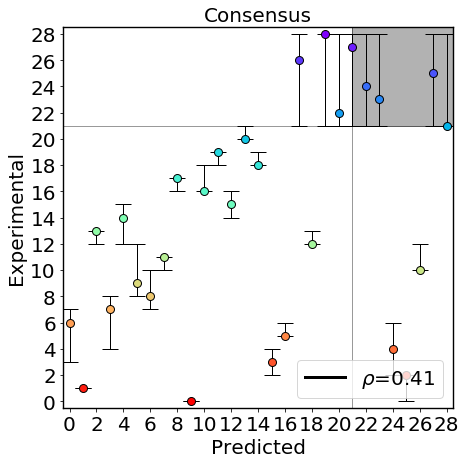

In [112]:
IMPORTANT_T = 800
ncols = 2
nrows = math.ceil(len(b_sizes)/ncols)
all_pred_ranks = []

fig, axs = plt.subplots(figsize=(ncols*8, nrows*8), ncols=ncols, nrows=nrows, gridspec_kw={'hspace':0.2, 'wspace':0.2})
for ax, b in zip(axs.flatten(), b_sizes):
    plot_ranking(weighted_deviation_from_rog, [IMPORTANT_T, distances, Ts, mean_rogs, b, True], a=ax, reverse_metric=False, yaxis="rank", loc='lower right')
    deviation = weighted_deviation_from_rog(IMPORTANT_T, distances, Ts, mean_rogs, block_size=b, ascending=True)
    pred_ranks = np.argsort(deviation)
    all_pred_ranks.append(pred_ranks)
#plt.tight_layout()
#plt.savefig("ExpVsPred.png", format='png', dpi=300)
plt.show()
plt.close()

all_pred_ranks = np.array(all_pred_ranks)
fig = plt.figure(figsize=(7,7))
ax = plot_ranking(consensed_rank, [all_pred_ranks], reverse_metric=True, yaxis="rank", loc='lower right', title="Consensus")
plt.show()
plt.close()

### _block size = 10_
### _T = [600 - 800] K_

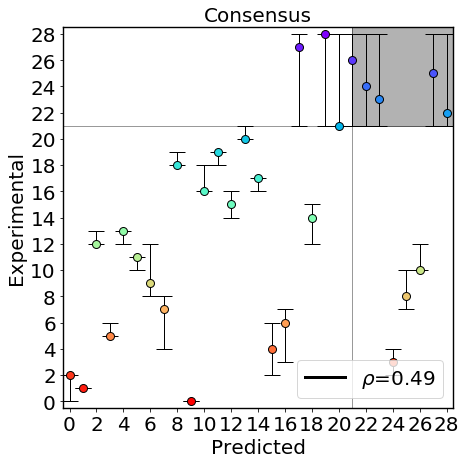

In [113]:
B = 10
included_temps = important_temps[np.logical_and(important_temps>=600, important_temps<=800)]

all_pred_ranks = []
for temp in included_temps:
    deviation = weighted_deviation_from_rog(temp, distances, Ts, mean_rogs, block_size=B, ascending=True)
    pred_ranks = np.argsort(deviation)
    all_pred_ranks.append(pred_ranks)

all_pred_ranks = np.array(all_pred_ranks)
fig = plt.figure(figsize=(7,7))
ax = plot_ranking(consensed_rank, [all_pred_ranks], reverse_metric=True, yaxis="rank", loc='lower right', title="Consensus")
plt.show()
plt.close()

## Blocks from the analytes FARTHEST to com (yes, com) from 1 to 10

rho(771.7) = 0.56
rho(800.0) = 0.56
rho(764.6) = 0.58
rho(686.9) = 0.60
rho(800.0) = 0.59
rho(729.3) = 0.57
rho(792.9) = 0.58
rho(800.0) = 0.56
rho(785.9) = 0.54
rho(792.9) = 0.53


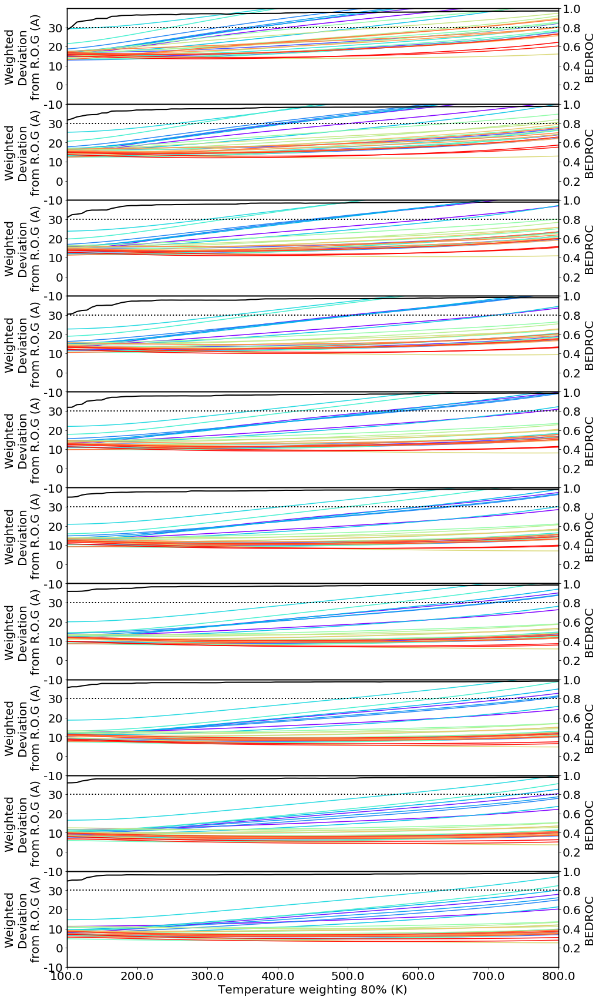

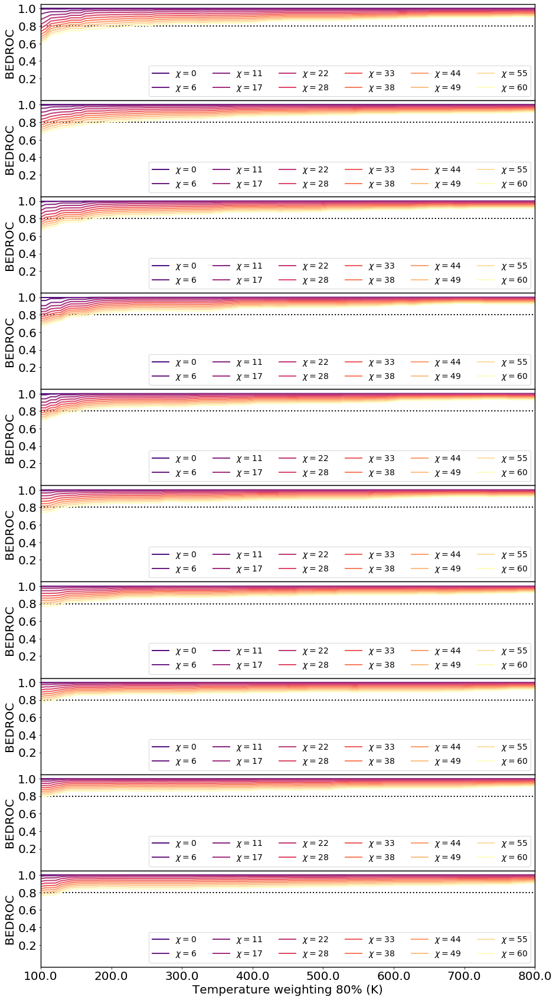

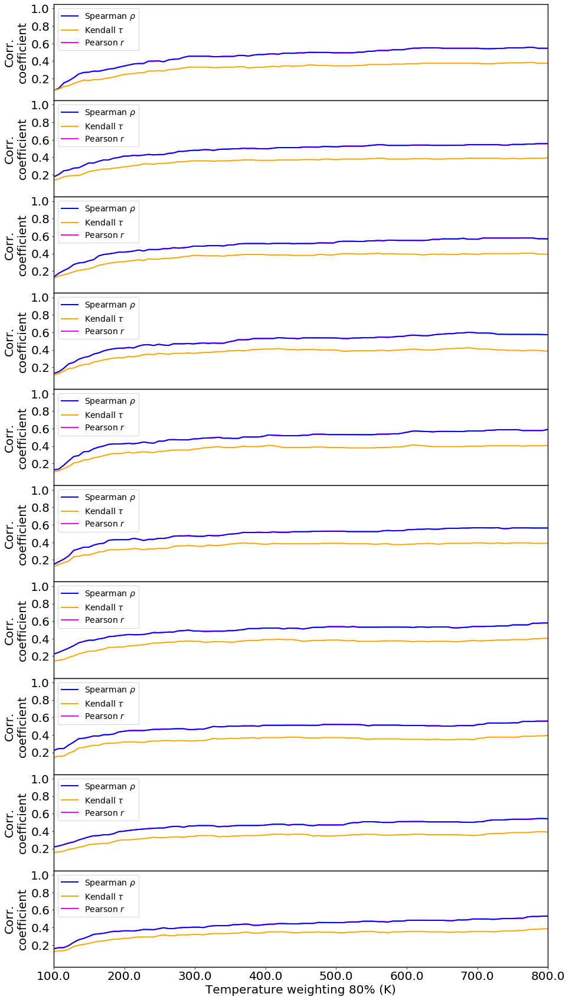

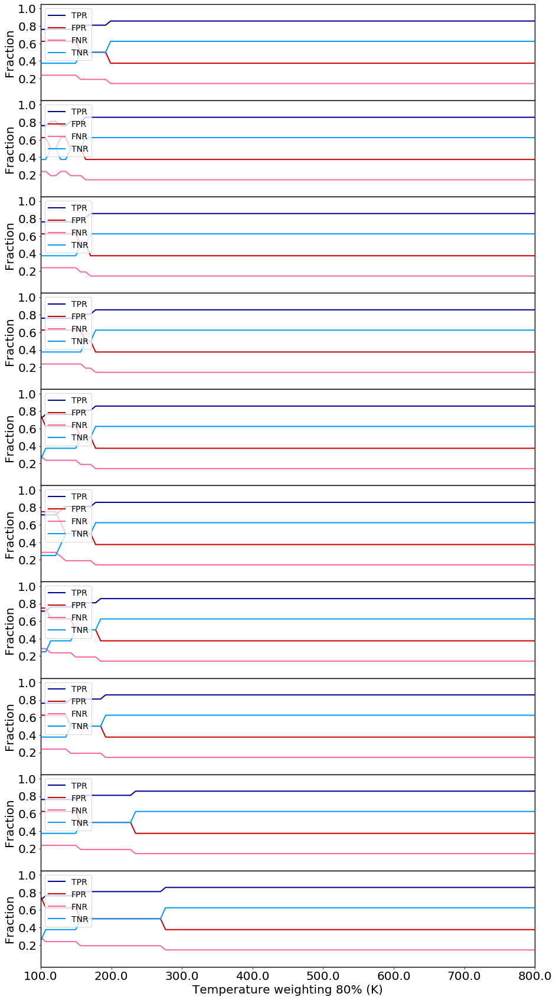

In [114]:
b_sizes = np.linspace(-1,-10,10, dtype='int')
important_temps = np.linspace(100, 800, 100)

xticks = np.linspace(min(important_temps), max(important_temps), 8, dtype='float')

fig1, axs1 = plt.subplots(figsize=(15,3*len(b_sizes)), sharex=True, ncols=1, nrows=len(b_sizes), gridspec_kw={'hspace':0.0, 'wspace':0.0})
fig2, axs2 = plt.subplots(figsize=(15,3*len(b_sizes)), sharex=True, ncols=1, nrows=len(b_sizes), gridspec_kw={'hspace':0.0, 'wspace':0.0})
fig3, axs3 = plt.subplots(figsize=(15,3*len(b_sizes)), sharex=True, ncols=1, nrows=len(b_sizes), gridspec_kw={'hspace':0.0, 'wspace':0.0})
fig4, axs4 = plt.subplots(figsize=(15,3*len(b_sizes)), sharex=True, ncols=1, nrows=len(b_sizes), gridspec_kw={'hspace':0.0, 'wspace':0.0})

for ax1, ax2, ax3, ax4, b in zip(axs1.flatten(), axs2.flatten(), axs3.flatten(), axs4.flatten(), b_sizes):
    plot_metric(weighted_deviation_from_rog, important_temps, [distances, Ts, mean_rogs, b, False], reverse_metric=False, 
                a1=ax1, a2=ax2, a3=ax3, a4=ax4,
               xticks1=xticks, xtl1=xticks, xlabel1="Temperature weighting 80% (K)", ylabel1="Weighted\nDeviation\nfrom R.O.G (A)", yticks1=np.arange(-10,40,10), ytl1=np.arange(-10,40,10), ylim1=(-10,40), a1fmty="%d", a1fmtx="%d",
               xticks2=xticks, xtl2=xticks, xlabel2="Temperature weighting 80% (K)", loc2="lower right", a2fmtx="%d",
               xticks3=xticks, xtl3=xticks, xlabel3="Temperature weighting 80% (K)", loc3="upper left", a3fmtx="%d",
               xticks4=xticks, xtl4=xticks, xlabel4="Temperature weighting 80% (K)", loc4="upper left", a4fmtx="%d")
plt.show()
plt.close()

### _Temperature weighting 80% = 800 K_

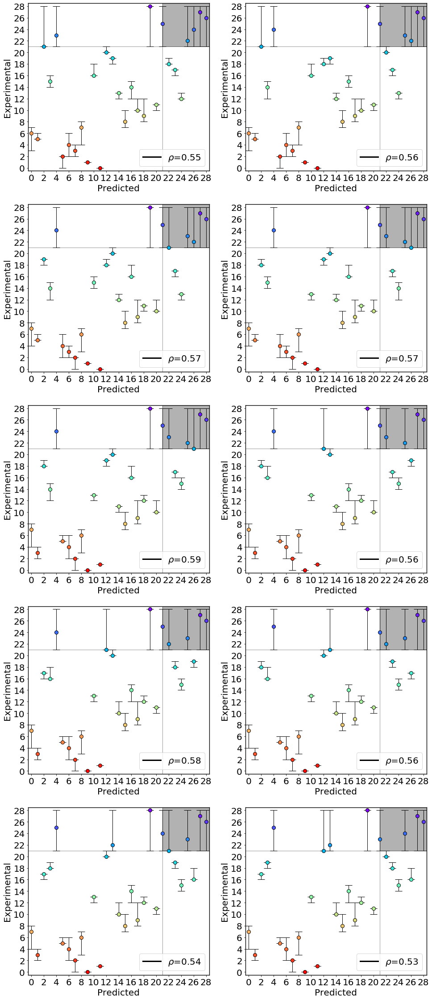

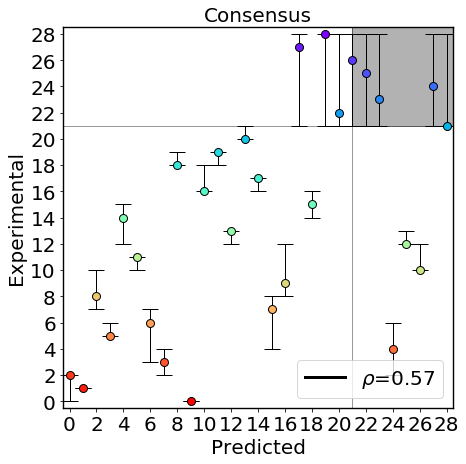

In [115]:
IMPORTANT_T = 800
ncols = 2
nrows = math.ceil(len(b_sizes)/ncols)
all_pred_ranks = []

fig, axs = plt.subplots(figsize=(ncols*8, nrows*8), ncols=ncols, nrows=nrows, gridspec_kw={'hspace':0.2, 'wspace':0.2})
for ax, b in zip(axs.flatten(), b_sizes):
    plot_ranking(weighted_deviation_from_rog, [IMPORTANT_T, distances, Ts, mean_rogs, b, False], a=ax, reverse_metric=False, yaxis="rank", loc='lower right')
    deviation = weighted_deviation_from_rog(IMPORTANT_T, distances, Ts, mean_rogs, block_size=b, ascending=False)
    pred_ranks = np.argsort(deviation)
    all_pred_ranks.append(pred_ranks)
#plt.tight_layout()
#plt.savefig("ExpVsPred.png", format='png', dpi=300)
plt.show()
plt.close()

all_pred_ranks = np.array(all_pred_ranks)
fig = plt.figure(figsize=(7,7))
ax = plot_ranking(consensed_rank, [all_pred_ranks], reverse_metric=True, yaxis="rank", loc='lower right', title="Consensus")
plt.show()
plt.close()

### _block size = 5_
### _T = [600 - 800] K_

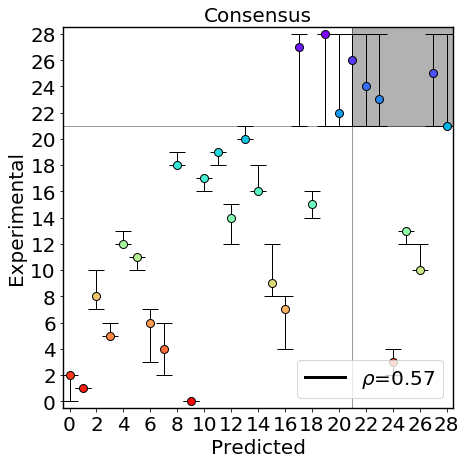

In [116]:
B = 5
included_temps = important_temps[np.logical_and(important_temps>=600, important_temps<=800)]

all_pred_ranks = []
for temp in included_temps:
    deviation = weighted_deviation_from_rog(temp, distances, Ts, mean_rogs, block_size=B, ascending=False)
    pred_ranks = np.argsort(deviation)
    all_pred_ranks.append(pred_ranks)

all_pred_ranks = np.array(all_pred_ranks)
fig = plt.figure(figsize=(7,7))
ax = plot_ranking(consensed_rank, [all_pred_ranks], reverse_metric=True, yaxis="rank", loc='lower right', title="Consensus")
plt.show()
plt.close()

# Distance between two block averages

In [117]:
def find_block_distance(dist_thres, times, distances, block_size=3):
    bye_times = []
    distances = np.sort(distances, axis=2)
    for distance in distances:
        up_means = np.mean(distance[:,:block_size], axis=1)
        down_means = np.mean(distance[:,block_size:], axis=1)
        diffs = np.abs(up_means-down_means)
        if np.sum(diffs>=dist_thres) == 0:
            bye_time = times[-1]
        else:
            bye_time = times[diffs>=dist_thres][0]
        bye_times.append(bye_time)
    bye_times = np.array(bye_times)
    return bye_times

rho(8.3) = 0.77
rho(8.1) = 0.70
rho(7.5) = 0.76
rho(18.6) = 0.75
rho(18.9) = 0.69


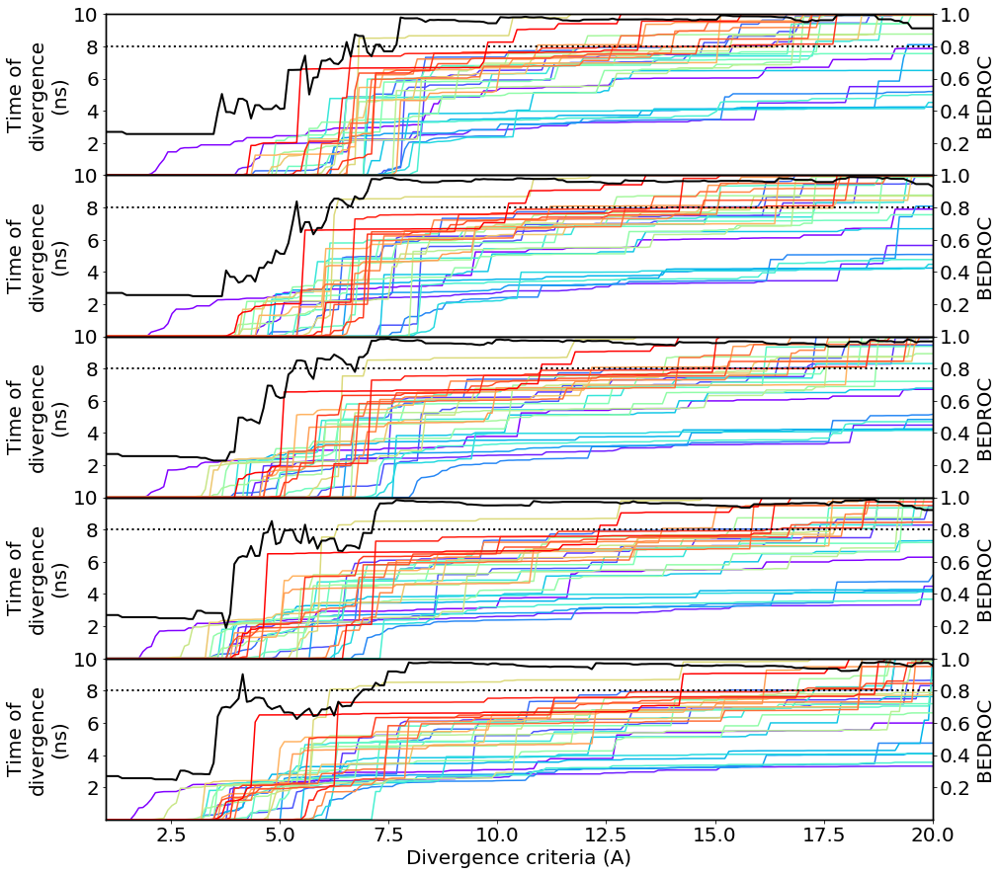

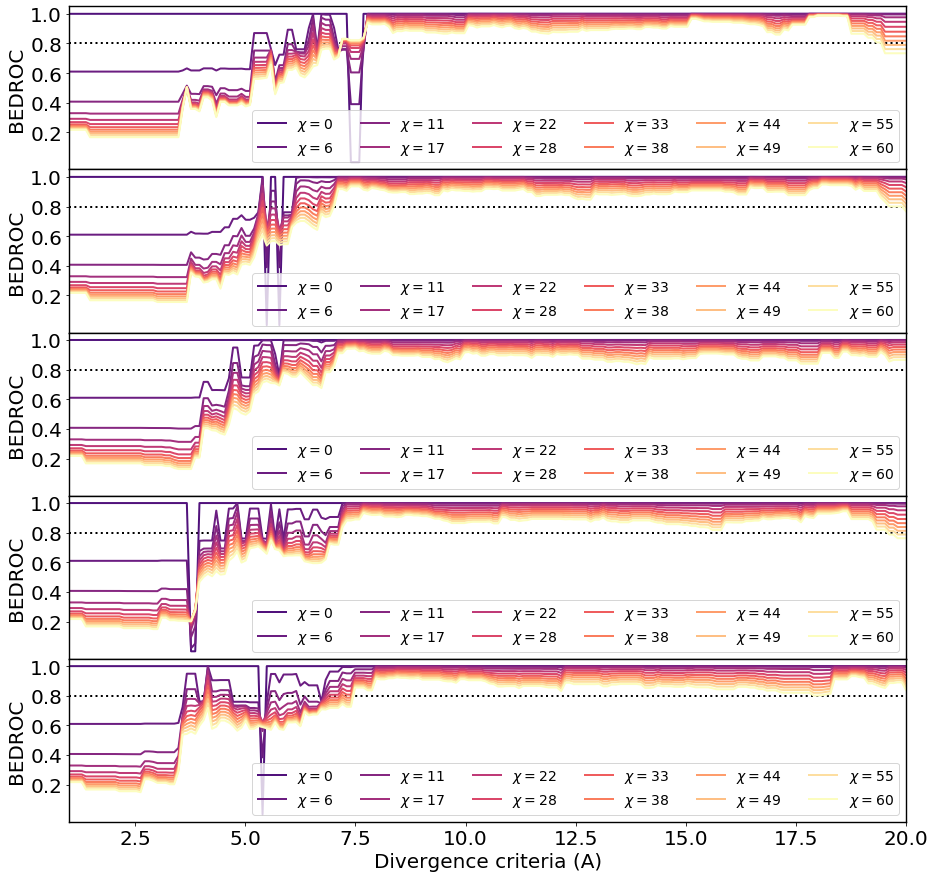

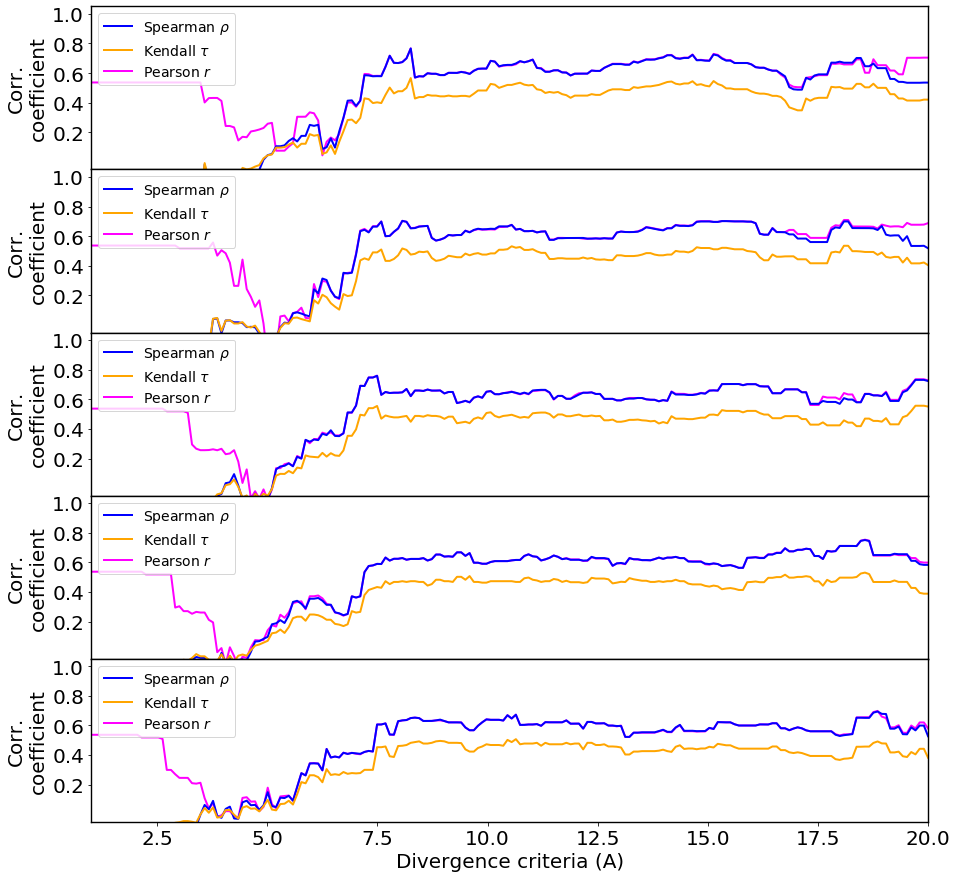

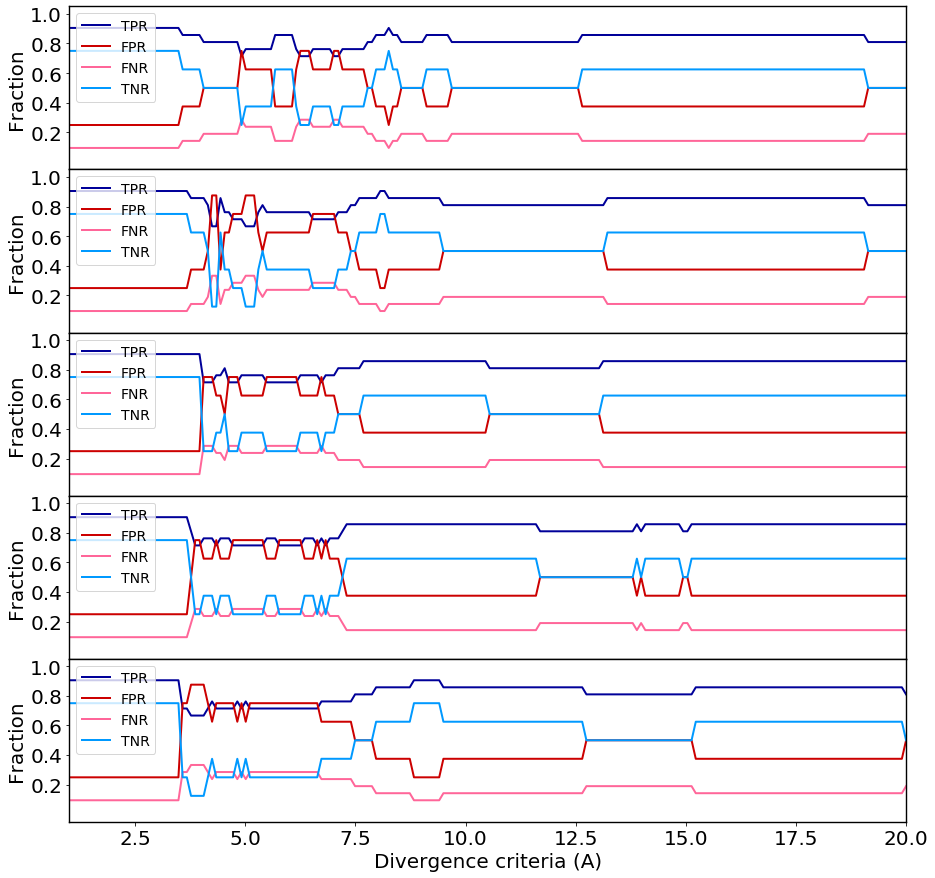

In [118]:
b_sizes = np.linspace(1,5,5, dtype='int')
ref_dists = np.linspace(1,20,200)

xticks = np.linspace(2.5, max(ref_dists), 8, dtype='float')

fig1, axs1 = plt.subplots(figsize=(15,3*len(b_sizes)), sharex=True, ncols=1, nrows=len(b_sizes), gridspec_kw={'hspace':0.0, 'wspace':0.0})
fig2, axs2 = plt.subplots(figsize=(15,3*len(b_sizes)), sharex=True, ncols=1, nrows=len(b_sizes), gridspec_kw={'hspace':0.0, 'wspace':0.0})
fig3, axs3 = plt.subplots(figsize=(15,3*len(b_sizes)), sharex=True, ncols=1, nrows=len(b_sizes), gridspec_kw={'hspace':0.0, 'wspace':0.0})
fig4, axs4 = plt.subplots(figsize=(15,3*len(b_sizes)), sharex=True, ncols=1, nrows=len(b_sizes), gridspec_kw={'hspace':0.0, 'wspace':0.0})

for ax1, ax2, ax3, ax4, b in zip(axs1.flatten(), axs2.flatten(), axs3.flatten(), axs4.flatten(), b_sizes):
    plot_metric(find_block_distance, ref_dists, [times, distances, b], reverse_metric=True, 
                a1=ax1, a2=ax2, a3=ax3, a4=ax4,
               xticks1=xticks, xtl1=xticks, xlabel1="Divergence criteria (A)", ylabel1="Time of\ndivergence\n(ns)", yticks1=np.arange(2,10.1, 2), ytl1=np.arange(2,10.1, 2), ylim1=(0,10), a1fmty="%d", a1fmtx="%.1f",
               xticks2=xticks, xtl2=xticks, xlabel2="Divergence criteria (A)", loc2="lower right", a2fmtx="%.1f",
               xticks3=xticks, xtl3=xticks, xlabel3="Divergence criteria (A)", loc3="upper left", a3fmtx="%.1f",
               xticks4=xticks, xtl4=xticks, xlabel4="Divergence criteria (A)", loc4="upper left", a4fmtx="%.1f")
plt.show()
plt.close()

### _Divergence distance betweem blocks = 8.26 A_

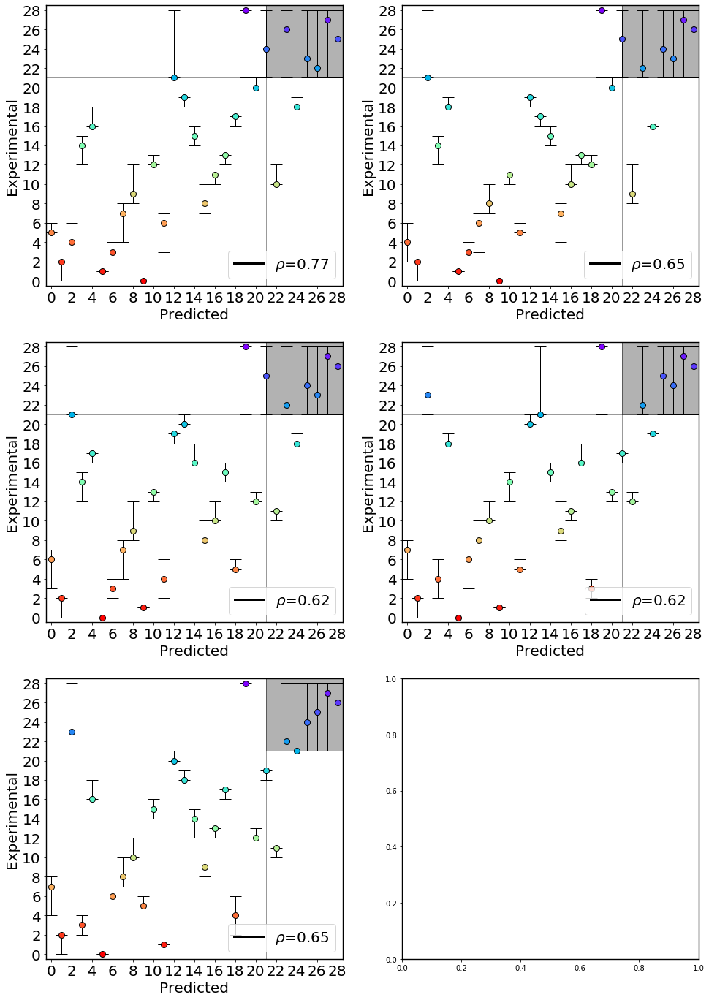

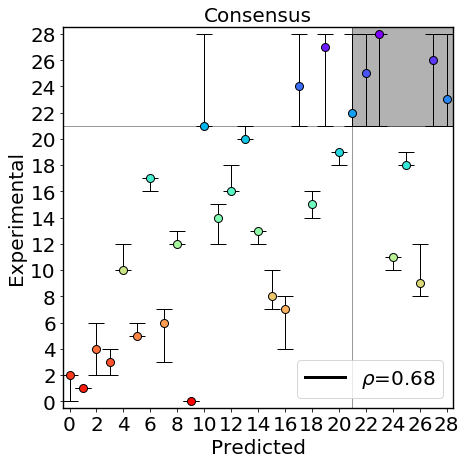

In [119]:
REF_DIST = 8.26
ncols = 2
nrows = math.ceil(len(b_sizes)/ncols)
all_pred_ranks = []

fig, axs = plt.subplots(figsize=(ncols*8, nrows*8), ncols=ncols, nrows=nrows, gridspec_kw={'hspace':0.2, 'wspace':0.2})
for ax, b in zip(axs.flatten(), b_sizes):
    plot_ranking(find_block_distance, [REF_DIST, times, distances, b], a=ax, reverse_metric=True, yaxis="rank", loc='lower right')
    bye_time = find_block_distance(REF_DIST, times, distances, block_size=b)
    pred_ranks = np.argsort(bye_time*-1)
    all_pred_ranks.append(pred_ranks)
#plt.tight_layout()
#plt.savefig("ExpVsPred.png", format='png', dpi=300)
plt.show()
plt.close()

all_pred_ranks = np.array(all_pred_ranks)
fig = plt.figure(figsize=(7,7))
ax = plot_ranking(consensed_rank, [all_pred_ranks], reverse_metric=True, yaxis="rank", loc='lower right', title="Consensus")
plt.show()
plt.close()

# Distance from the top to the COM

In [120]:
def find_block_distance_com(dist_thres, times, distances, block_size=1, ascending=True):
    bye_times = []
    distances = np.sort(distances, axis=2)
    for distance in distances:
        if ascending:
            up_means = np.mean(distance[:,:block_size], axis=1)
        else:
            up_means = np.mean(distance[:,block_size:], axis=1)
        if np.sum(up_means>=dist_thres) == 0:
            bye_time = times[-1]
        else:
            bye_time = times[up_means>=dist_thres][0]
        bye_times.append(bye_time)
    bye_times = np.array(bye_times)
    return bye_times

## Blocks from the analytes CLOSEST to com from 1 to 10

rho(20.1) = 0.73
rho(20.3) = 0.74
rho(23.3) = 0.74
rho(24.6) = 0.76
rho(25.6) = 0.76
rho(26.6) = 0.77
rho(27.6) = 0.75
rho(28.8) = 0.74
rho(30.4) = 0.76
rho(31.9) = 0.75


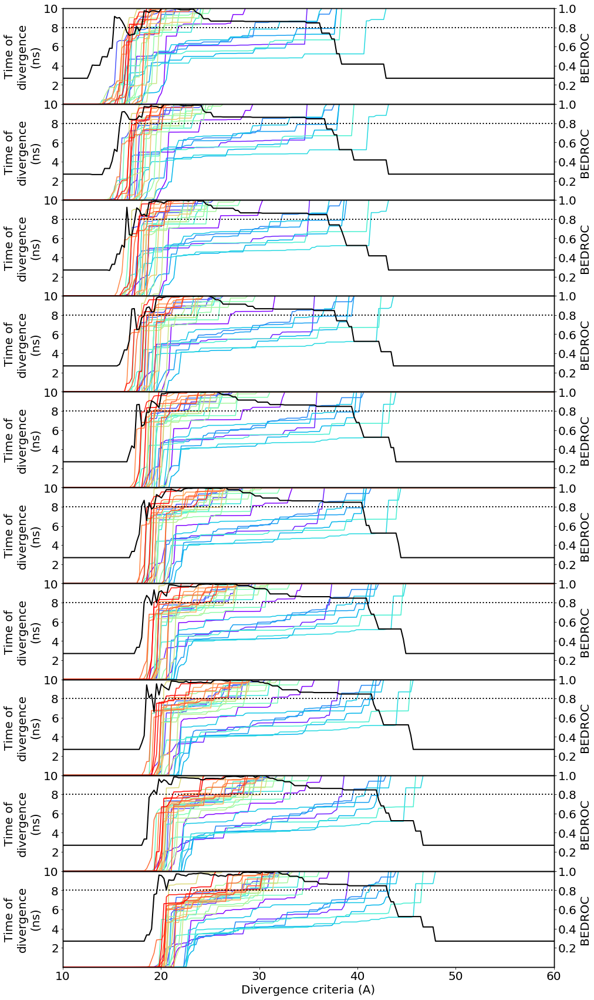

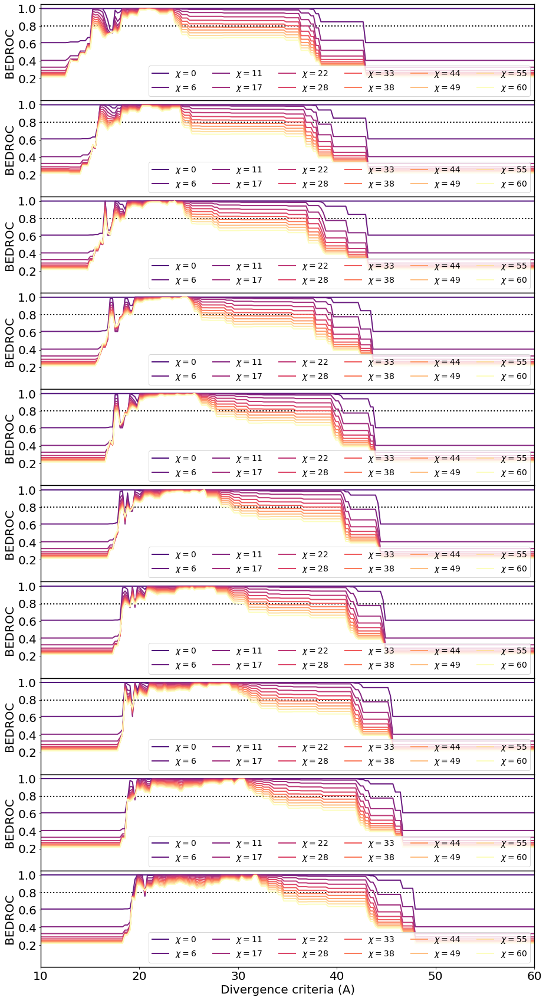

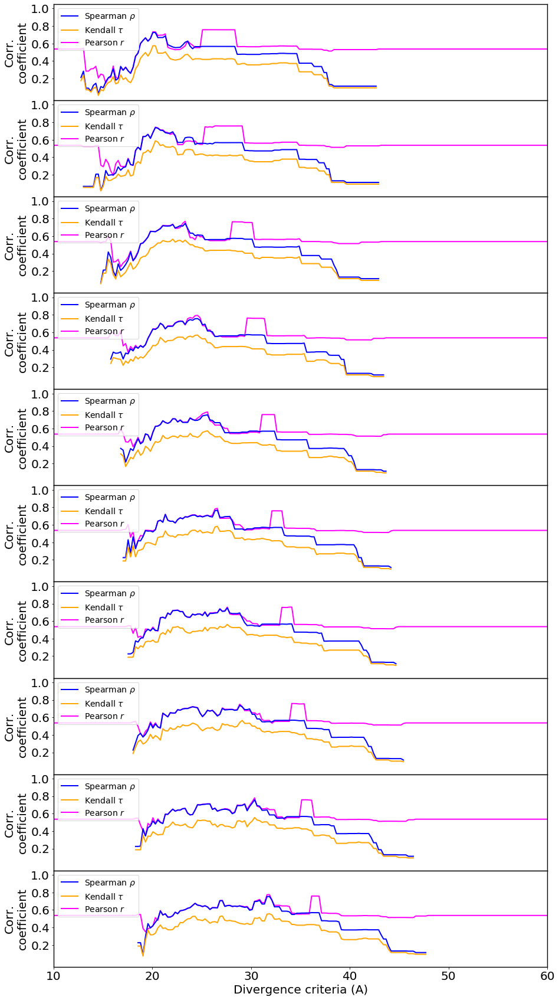

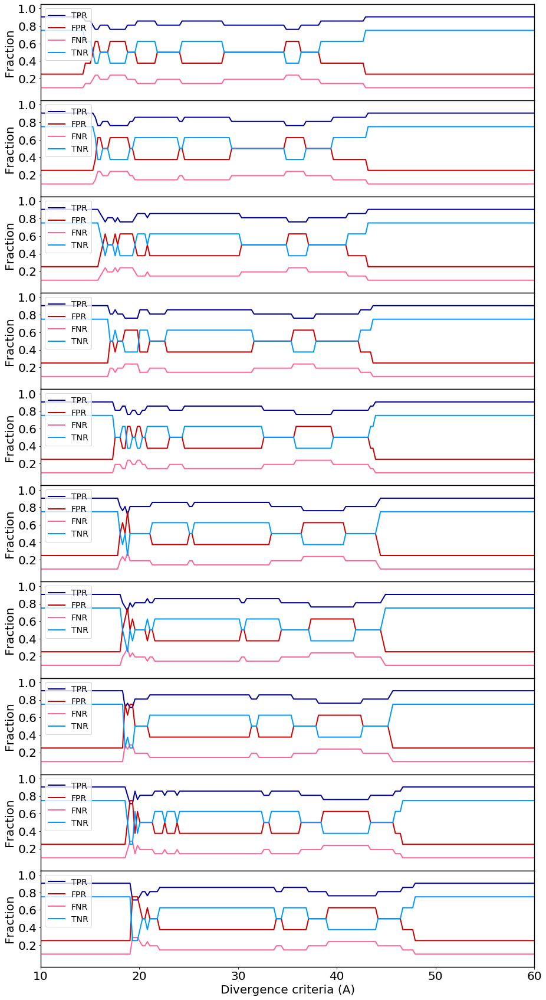

In [126]:
b_sizes = np.linspace(1,10,10, dtype='int')
ref_dists = np.linspace(10,60,200)

xticks = np.linspace(min(ref_dists), max(ref_dists), 6, dtype='int')

fig1, axs1 = plt.subplots(figsize=(15,3*len(b_sizes)), sharex=True, ncols=1, nrows=len(b_sizes), gridspec_kw={'hspace':0.0, 'wspace':0.0})
fig2, axs2 = plt.subplots(figsize=(15,3*len(b_sizes)), sharex=True, ncols=1, nrows=len(b_sizes), gridspec_kw={'hspace':0.0, 'wspace':0.0})
fig3, axs3 = plt.subplots(figsize=(15,3*len(b_sizes)), sharex=True, ncols=1, nrows=len(b_sizes), gridspec_kw={'hspace':0.0, 'wspace':0.0})
fig4, axs4 = plt.subplots(figsize=(15,3*len(b_sizes)), sharex=True, ncols=1, nrows=len(b_sizes), gridspec_kw={'hspace':0.0, 'wspace':0.0})

for ax1, ax2, ax3, ax4, b in zip(axs1.flatten(), axs2.flatten(), axs3.flatten(), axs4.flatten(), b_sizes):
    plot_metric(find_block_distance_com, ref_dists, [times, distances, b, True], reverse_metric=True, 
                a1=ax1, a2=ax2, a3=ax3, a4=ax4,
               xticks1=xticks, xtl1=xticks, xlabel1="Divergence criteria (A)", ylabel1="Time of\ndivergence\n(ns)", yticks1=np.arange(2,10.1, 2), ytl1=np.arange(2,10.1, 2), ylim1=(0,10), a1fmty="%d", a1fmtx="%d",
               xticks2=xticks, xtl2=xticks, xlabel2="Divergence criteria (A)", loc2="lower right", a2fmtx="%d",
               xticks3=xticks, xtl3=xticks, xlabel3="Divergence criteria (A)", loc3="upper left", a3fmtx="%d",
               xticks4=xticks, xtl4=xticks, xlabel4="Divergence criteria (A)", loc4="upper left", a4fmtx="%d")
plt.show()
plt.close()

### _Distance from the bottom to the COM = 26.58A_

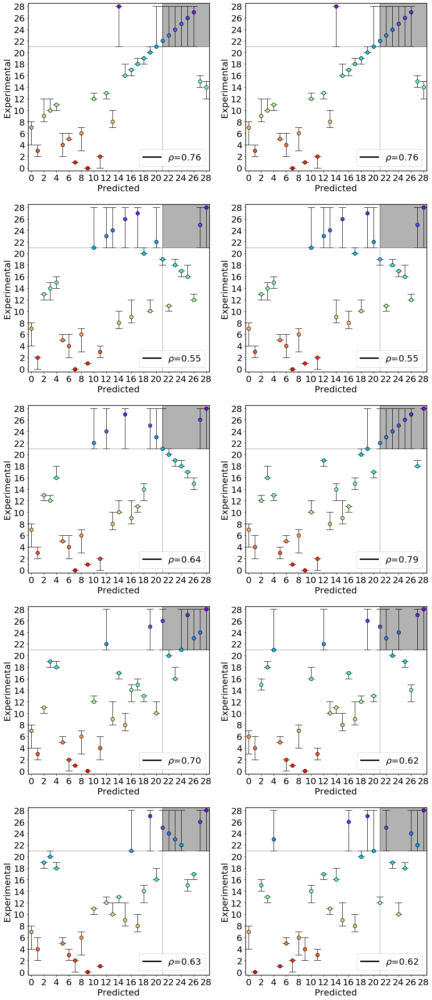

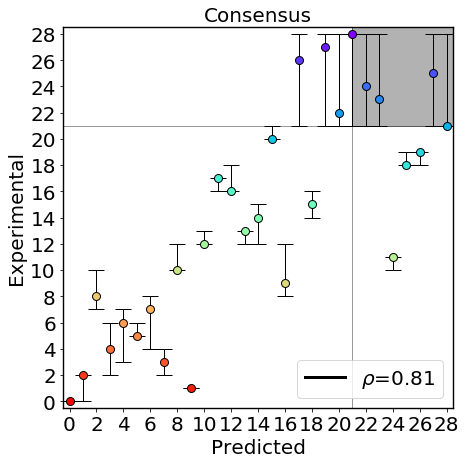

In [129]:
REF_DIST = 26.58
ncols = 2
nrows = math.ceil(len(b_sizes)/ncols)
all_pred_ranks = []

fig, axs = plt.subplots(figsize=(ncols*8, nrows*8), ncols=ncols, nrows=nrows, gridspec_kw={'hspace':0.2, 'wspace':0.2})
for ax, b in zip(axs.flatten(), b_sizes):
    plot_ranking(find_block_distance_com, [REF_DIST, times, distances, b, True], a=ax, reverse_metric=True, yaxis="rank", loc='lower right')
    bye_time = find_block_distance_com(REF_DIST, times, distances, block_size=b, ascending=True)
    pred_ranks = np.argsort(bye_time*-1)
    all_pred_ranks.append(pred_ranks)
#plt.tight_layout()
#plt.savefig("ExpVsPred.png", format='png', dpi=300)
plt.show()
plt.close()

all_pred_ranks = np.array(all_pred_ranks)
fig = plt.figure(figsize=(7,7))
ax = plot_ranking(consensed_rank, [all_pred_ranks], reverse_metric=True, yaxis="rank", loc='lower right', title="Consensus")
#plt.savefig("ExpVsPred_consensus.png", format='png', dpi=300)
plt.show()
plt.close()

## Blocks from the analytes FARTHEST to com from 1 to 10

rho(51.5) = 0.68
rho(41.4) = 0.63
rho(30.4) = 0.65
rho(43.4) = 0.72
rho(39.4) = 0.73
rho(38.4) = 0.74
rho(22.8) = 0.72
rho(33.6) = 0.72
rho(33.4) = 0.75
rho(31.9) = 0.75


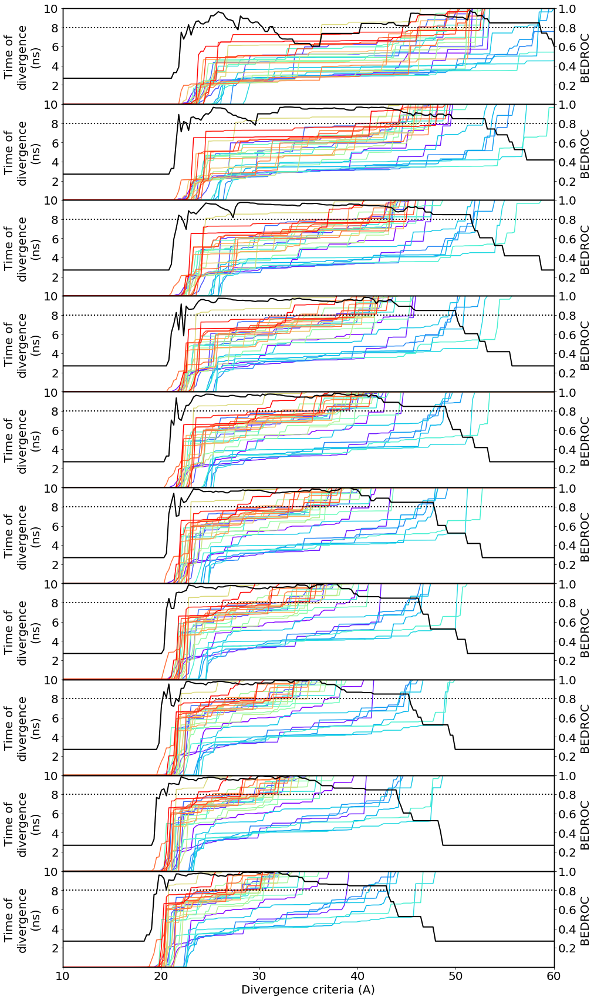

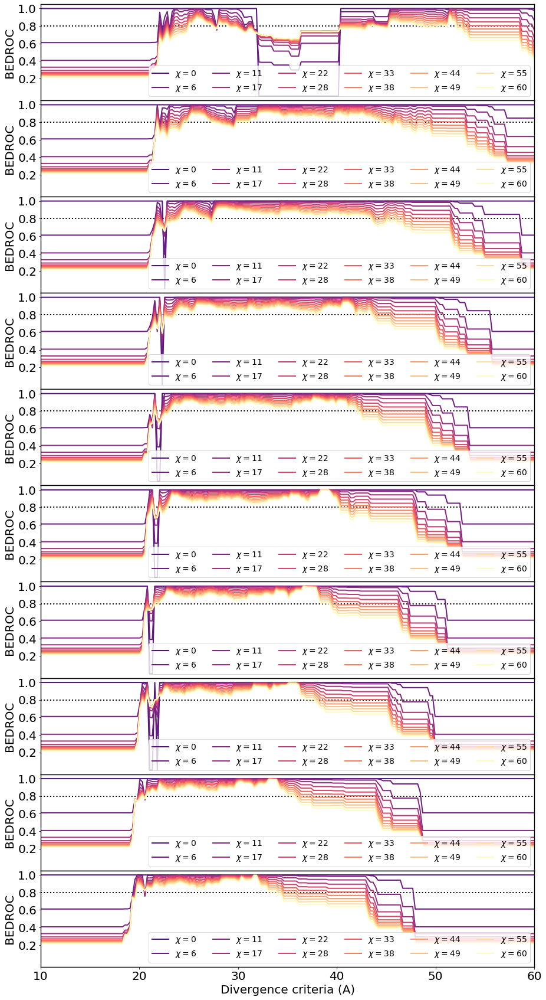

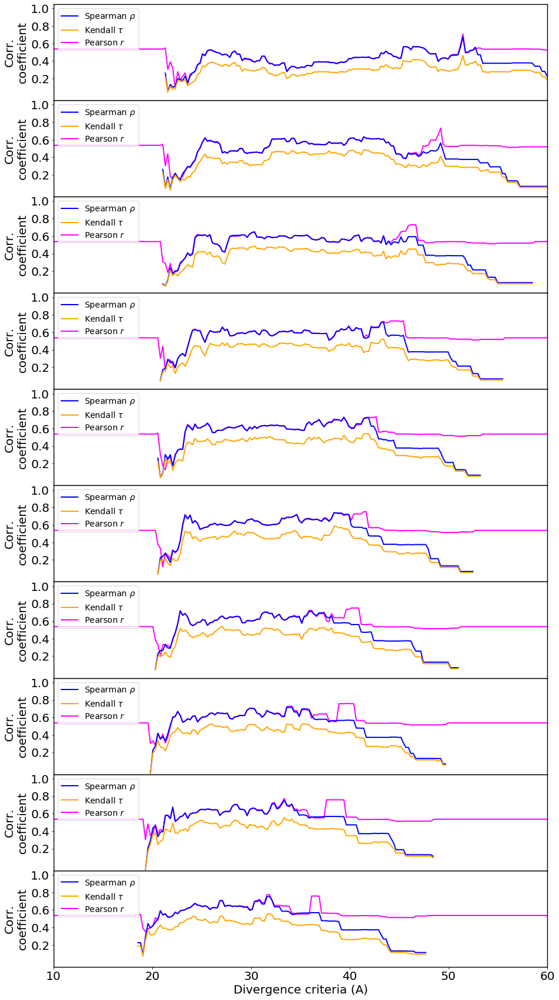

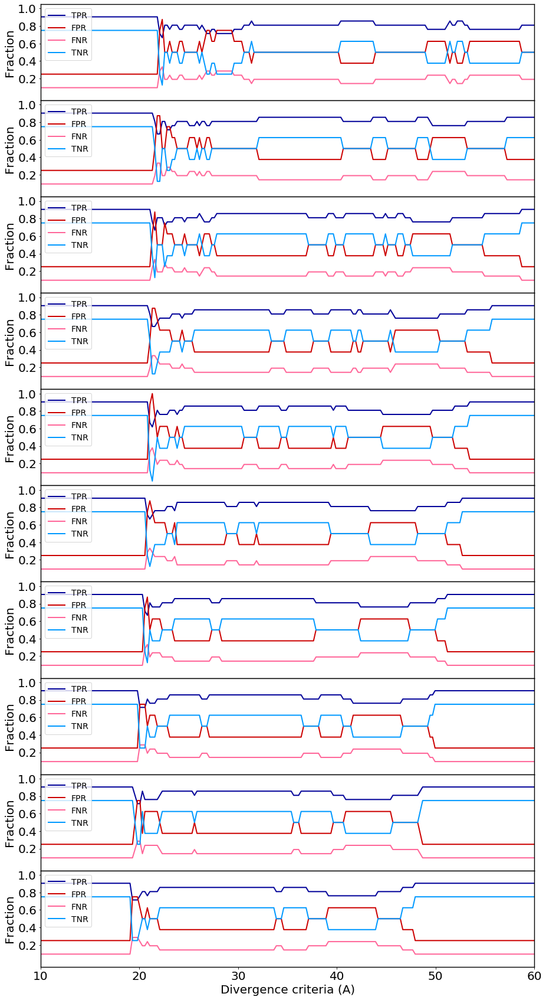

In [123]:
b_sizes = np.linspace(-1,-10,10, dtype='int')
ref_dists = np.linspace(10,60,200)

xticks = np.linspace(min(ref_dists), max(ref_dists), 6, dtype='int')

fig1, axs1 = plt.subplots(figsize=(15,3*len(b_sizes)), sharex=True, ncols=1, nrows=len(b_sizes), gridspec_kw={'hspace':0.0, 'wspace':0.0})
fig2, axs2 = plt.subplots(figsize=(15,3*len(b_sizes)), sharex=True, ncols=1, nrows=len(b_sizes), gridspec_kw={'hspace':0.0, 'wspace':0.0})
fig3, axs3 = plt.subplots(figsize=(15,3*len(b_sizes)), sharex=True, ncols=1, nrows=len(b_sizes), gridspec_kw={'hspace':0.0, 'wspace':0.0})
fig4, axs4 = plt.subplots(figsize=(15,3*len(b_sizes)), sharex=True, ncols=1, nrows=len(b_sizes), gridspec_kw={'hspace':0.0, 'wspace':0.0})

for ax1, ax2, ax3, ax4, b in zip(axs1.flatten(), axs2.flatten(), axs3.flatten(), axs4.flatten(), b_sizes):
    plot_metric(find_block_distance_com, ref_dists, [times, distances, b, False], reverse_metric=True, 
                a1=ax1, a2=ax2, a3=ax3, a4=ax4,
               xticks1=xticks, xtl1=xticks, xlabel1="Divergence criteria (A)", ylabel1="Time of\ndivergence\n(ns)", yticks1=np.arange(2,10.1, 2), ytl1=np.arange(2,10.1, 2), ylim1=(0,10), a1fmty="%d", a1fmtx="%d",
               xticks2=xticks, xtl2=xticks, xlabel2="Divergence criteria (A)", loc2="lower right", a2fmtx="%d",
               xticks3=xticks, xtl3=xticks, xlabel3="Divergence criteria (A)", loc3="upper left", a3fmtx="%d",
               xticks4=xticks, xtl4=xticks, xlabel4="Divergence criteria (A)", loc4="upper left", a4fmtx="%d")
plt.show()
plt.close()

### _Distance from the bottom to the COM = 33.12 A_

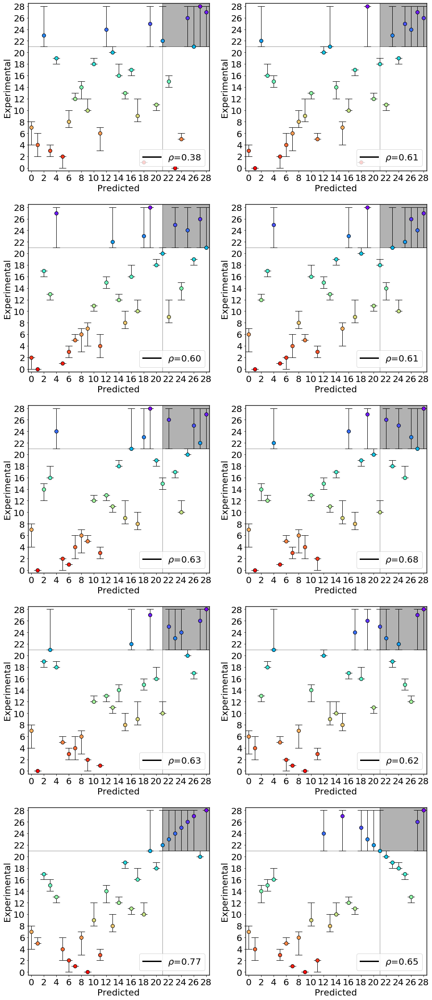

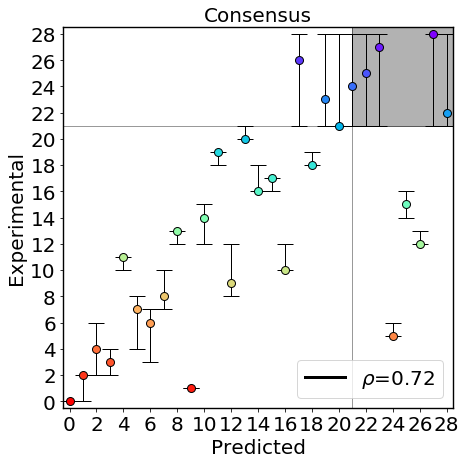

In [124]:
REF_DIST = 33.12
ncols = 2
nrows = math.ceil(len(b_sizes)/ncols)
all_pred_ranks = []

fig, axs = plt.subplots(figsize=(ncols*8, nrows*8), ncols=ncols, nrows=nrows, gridspec_kw={'hspace':0.2, 'wspace':0.2})
for ax, b in zip(axs.flatten(), b_sizes):
    plot_ranking(find_block_distance_com, [REF_DIST, times, distances, b, False], a=ax, reverse_metric=True, yaxis="rank", loc='lower right')
    bye_time = find_block_distance_com(REF_DIST, times, distances, block_size=b, ascending=False)
    pred_ranks = np.argsort(bye_time*-1)
    all_pred_ranks.append(pred_ranks)
#plt.tight_layout()
#plt.savefig("ExpVsPred.png", format='png', dpi=300)
plt.show()
plt.close()

all_pred_ranks = np.array(all_pred_ranks)
fig = plt.figure(figsize=(7,7))
ax = plot_ranking(consensed_rank, [all_pred_ranks], reverse_metric=True, yaxis="rank", loc='lower right', title="Consensus")
plt.show()
plt.close()

In [125]:
#k-cross validation